## Figure

In [ ]:
# !cd /raid1/cqy/CD45-/Graduation_project

In [3]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as an
import matplotlib.pyplot as plt
import seaborn as sns
import os
from scipy.sparse import csr_matrix

In [4]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/umap/distances.py:108

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.24.3 scipy==1.10.1 pandas==1.5.0 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 pynndescent==0.5.10


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()


### Figure 3 - Metadata

In [3]:
adata = sc.read_h5ad("2.BatchCorrection/merge.h5ad")
adata

AnnData object with n_obs × n_vars = 203828 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [10]:
adata.obs.head(5)

,method,sampleID,disease,dataset,sex,age,smoking_status,major_cell_type,cellID,histology
ATTCTACCAAGGTTCT_HD68,10x,homosapiens_None_2023_None_sikkemalisa_002_d10...,normal,Banovich_Kropski_2020,Male,unknown,Yes,Endothelial,ATTCTACCAAGGTTCT_HD68,normal
CTGATAGTCTTAGAGC_F01367,10x,homosapiens_None_2023_None_sikkemalisa_002_d10...,normal,Banovich_Kropski_2020,Male,unknown,Yes,Endothelial,CTGATAGTCTTAGAGC_F01367,normal
GGCTGGTTCTTAACCT_F01851,10x,homosapiens_None_2023_None_sikkemalisa_002_d10...,normal,Banovich_Kropski_2020,Female,unknown,Yes,Endothelial,GGCTGGTTCTTAACCT_F01851,normal
P3_4_CGGACGTTCATTCACT,10x,homosapiens_None_2023_None_sikkemalisa_002_d10...,normal,Krasnow_2020,Female,unknown,No,Stroma,P3_4_CGGACGTTCATTCACT,normal
GCACATAAGTTCGCAT_HD68,10x,homosapiens_None_2023_None_sikkemalisa_002_d10...,normal,Banovich_Kropski_2020,Male,unknown,Yes,Endothelial,GCACATAAGTTCGCAT_HD68,normal


In [12]:
metadata = adata.obs.loc[:, ["sampleID", "disease", "dataset", "sex", "age", "smoking_status"]].drop_duplicates()
metadata.to_csv("Figure/metadata.csv")
metadata.head(5)

,sampleID,disease,dataset,sex,age,smoking_status
ATTCTACCAAGGTTCT_HD68,homosapiens_None_2023_None_sikkemalisa_002_d10...,normal,Banovich_Kropski_2020,Male,unknown,Yes
CTGATAGTCTTAGAGC_F01367,homosapiens_None_2023_None_sikkemalisa_002_d10...,normal,Banovich_Kropski_2020,Male,unknown,Yes
GGCTGGTTCTTAACCT_F01851,homosapiens_None_2023_None_sikkemalisa_002_d10...,normal,Banovich_Kropski_2020,Female,unknown,Yes
P3_4_CGGACGTTCATTCACT,homosapiens_None_2023_None_sikkemalisa_002_d10...,normal,Krasnow_2020,Female,unknown,No
ACCCACTTCAAACCGT_F02524,homosapiens_None_2023_None_sikkemalisa_002_d10...,normal,Banovich_Kropski_2020,Male,unknown,No


### Figure 4 - Datasets

#### Figure 4H - HLCA dataset

In [3]:
hlca = sc.read_h5ad("0.RawData/HLCA.h5ad")
hlca = hlca.raw.to_adata()
hlca_subset = hlca[hlca.obs["disease"].isin(["normal", 
                                             "chronic obstructive pulmonary disease", 
                                             "pulmonary fibrosis",
                                             "COVID-19",
                                             "squamous cell lung carcinoma", "lung adenocarcinoma", 
                                             "pleomorphic carcinoma", "lung large cell carcinoma"])]
hlca_subset = hlca_subset[hlca_subset.obs["suspension_type"] == "cell"]
hlca_subset = hlca_subset[(hlca_subset.obs["disease"] != "normal") | ((hlca_subset.obs["disease"] == "normal") & (hlca_subset.obs["core_or_extension"] == "core"))]
hlca_subset

View of AnnData object with n_obs × n_vars = 1289524 × 56295
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmo

In [4]:
hlca_subset = hlca_subset[hlca_subset.obs["ann_level_1"] != "Unknown"]

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


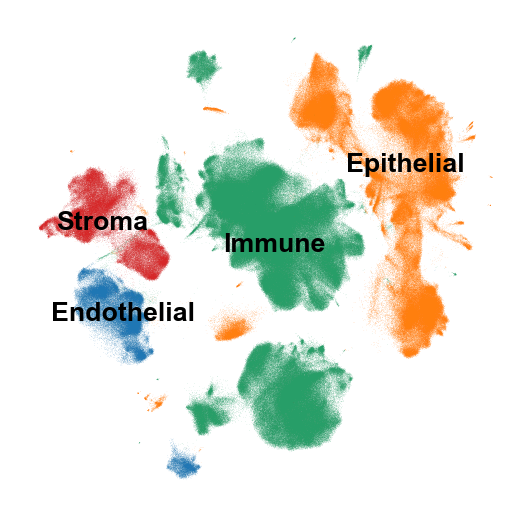

In [5]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(hlca_subset, 
               color = "ann_level_1",
               title = "",
               legend_loc = "on data",
               legend_fontsize = 12,
               frameon = False,
               save = "1D-hlca-celltype.pdf")

In [6]:
hlca_subset.var["ensembl_ID"] = hlca_subset.var.index
hlca_subset.var_names = hlca_subset.var["feature_name"].tolist()
hlca_subset.var_names_make_unique()

In [7]:
sc.pp.normalize_total(hlca_subset, target_sum = 1e4)
sc.pp.log1p(hlca_subset)

normalizing counts per cell
    finished (0:00:15)


In [8]:
hlca_subset

AnnData object with n_obs × n_vars = 1284740 × 56295
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmonized', 

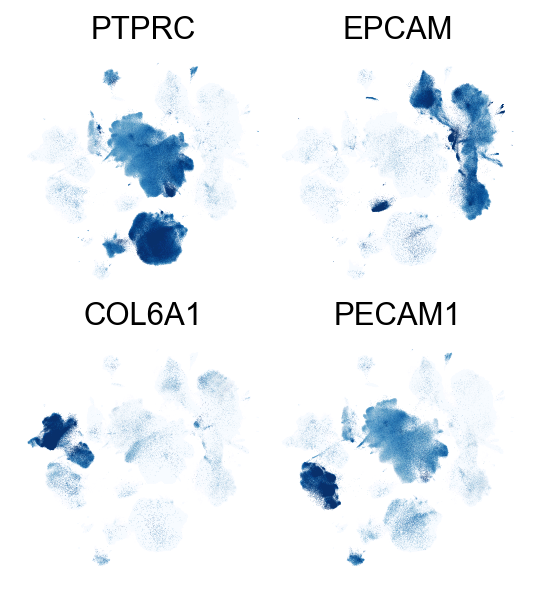

In [10]:
with plt.rc_context({'figure.figsize': (2,2)}):
    sc.pl.umap(hlca_subset, 
               color = ["PTPRC", "EPCAM", "COL6A1", "PECAM1"],
               legend_loc = "on data",
               ncols = 2, hspace = 0.2, wspace = 0,
               frameon = False,
               vmax = 'p99', vmin = 0.0001,
               color_map = "Blues", colorbar_loc = None,
               save = "1D-hlca-marker.pdf")

#### Figure 4A-G - Other public datasets

In [18]:
copd_Morrisey = sc.read_h5ad("1.ProcessedData/copd_Morrisey_2022.h5ad")

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


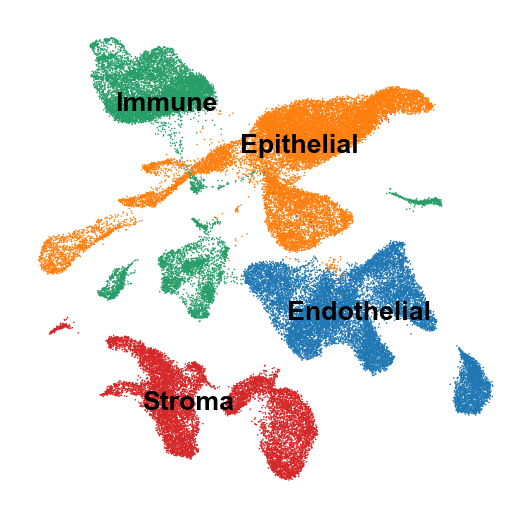

In [42]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(copd_Morrisey, 
               color = "major_cell_type",
               title = "",
               legend_loc = "on data",
               legend_fontsize = 12,
               frameon = False,
               save = "1D-Morrisey-celltype.pdf")

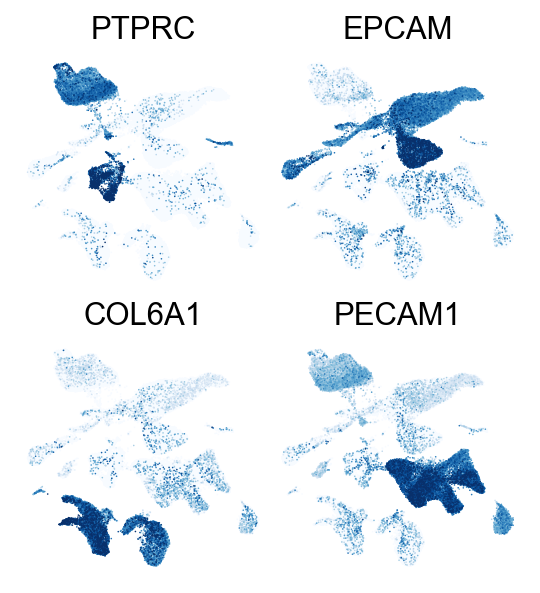

In [46]:
with plt.rc_context({'figure.figsize': (2,2)}):
    sc.pl.umap(copd_Morrisey, 
               color = ["PTPRC", "EPCAM", "COL6A1", "PECAM1"],
               legend_loc = "on data",
               ncols = 2, hspace = 0.2, wspace = 0,
               frameon = False,
               vmax = 'p99', vmin = 0.0001,
               color_map = "Blues", colorbar_loc = None,
               save = "1D-Morrisey-marker.pdf")

In [3]:
copd_Yamamoto = sc.read_h5ad("1.ProcessedData/copd_Yamamoto_2022.h5ad")

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


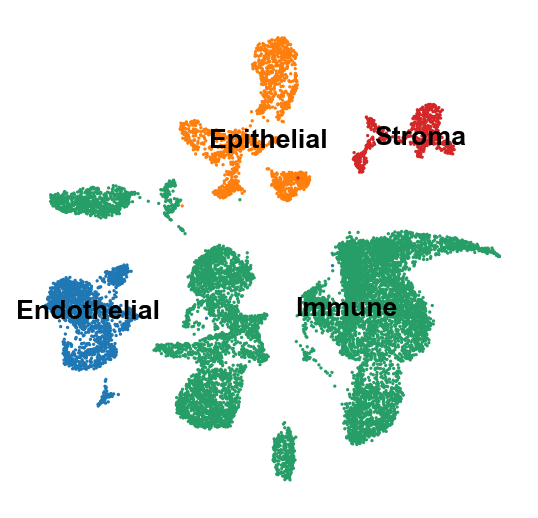

In [5]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(copd_Yamamoto, 
               color = "major_cell_type",
               title = "",
               legend_loc = "on data",
               legend_fontsize = 12,
               frameon = False,
               save = "1D-Yamamoto-celltype.pdf")

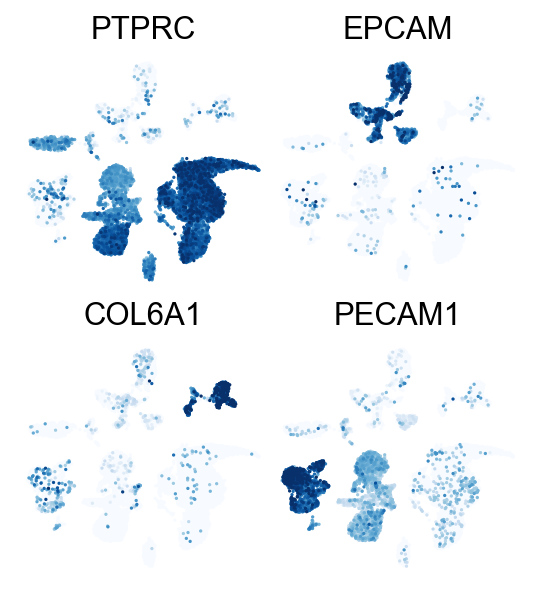

In [6]:
with plt.rc_context({'figure.figsize': (2,2)}):
    sc.pl.umap(copd_Yamamoto, 
               color = ["PTPRC", "EPCAM", "COL6A1", "PECAM1"],
               legend_loc = "on data",
               ncols = 2, hspace = 0.2, wspace = 0,
               frameon = False,
               vmax = 'p99', vmin = 0.0001,
               color_map = "Blues", colorbar_loc = None,
               save = "1D-Yamamoto-marker.pdf")

In [7]:
cancer_Lee = sc.read_h5ad("1.ProcessedData/cancer_Lee_2020.h5ad")

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


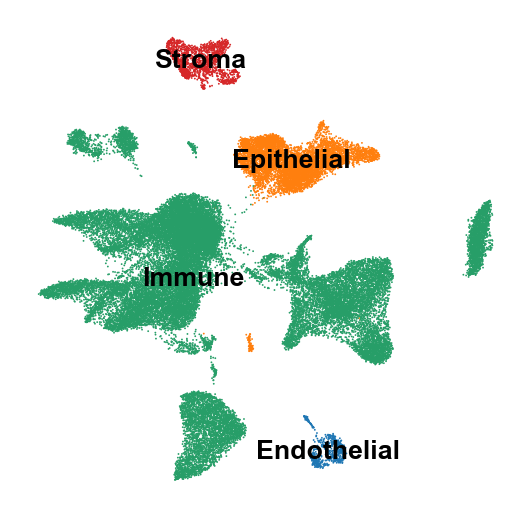

In [10]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(cancer_Lee, 
               color = "major_cell_type",
               title = "",
               legend_loc = "on data",
               legend_fontsize = 12,
               frameon = False,
               save = "1D-Lee-celltype.pdf")

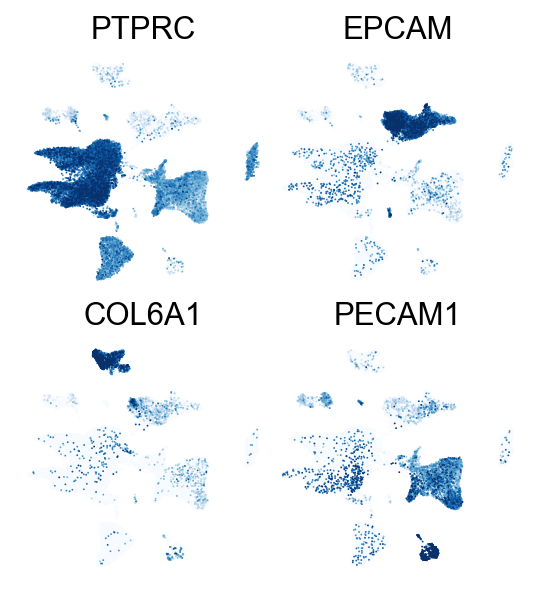

In [11]:
with plt.rc_context({'figure.figsize': (2,2)}):
    sc.pl.umap(cancer_Lee, 
               color = ["PTPRC", "EPCAM", "COL6A1", "PECAM1"],
               legend_loc = "on data",
               ncols = 2, hspace = 0.2, wspace = 0,
               frameon = False,
               vmax = 'p99', vmin = 0.0001,
               color_map = "Blues", colorbar_loc = None,
               save = "1D-Lee-marker.pdf")

In [13]:
cancer_Klauschen = sc.read_h5ad("1.ProcessedData/cancer_Klauschen_2021.h5ad")

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


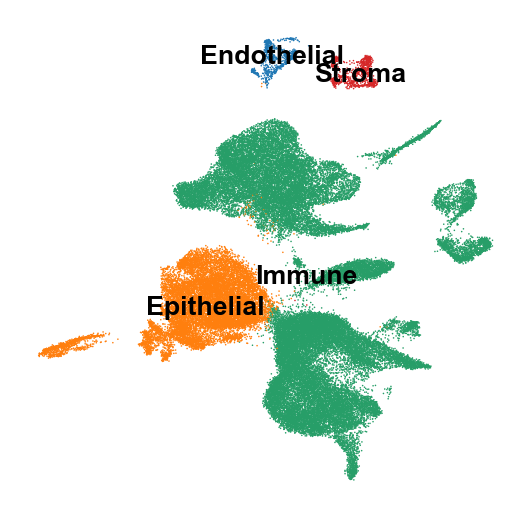

In [14]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(cancer_Klauschen, 
               color = "major_cell_type",
               title = "",
               legend_loc = "on data",
               legend_fontsize = 12,
               frameon = False,
               save = "1D-Klauschen-celltype.pdf")

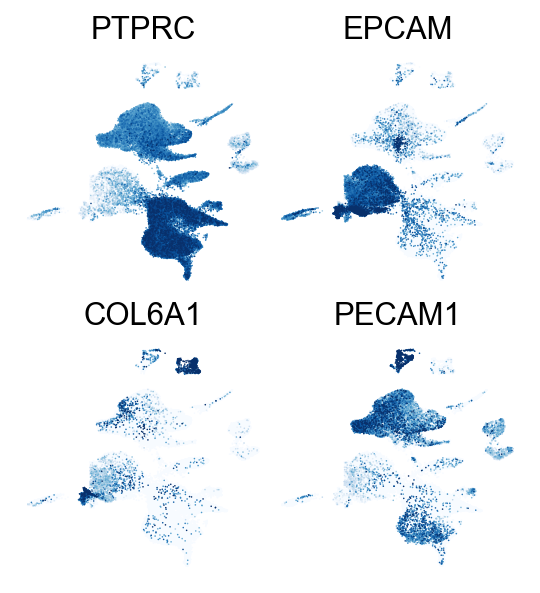

In [15]:
with plt.rc_context({'figure.figsize': (2,2)}):
    sc.pl.umap(cancer_Klauschen, 
               color = ["PTPRC", "EPCAM", "COL6A1", "PECAM1"],
               legend_loc = "on data",
               ncols = 2, hspace = 0.2, wspace = 0,
               frameon = False,
               vmax = 'p99', vmin = 0.0001,
               color_map = "Blues", colorbar_loc = None,
               save = "1D-Klauschen-marker.pdf")

In [17]:
cancer_Levantini = sc.read_h5ad("1.ProcessedData/cancer_Levantini_2021.h5ad")

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


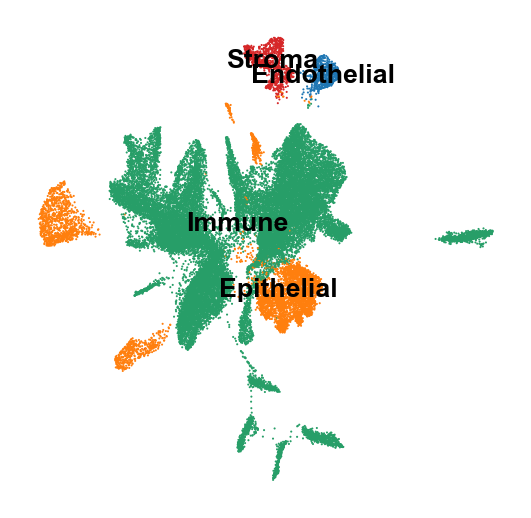

In [18]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(cancer_Levantini, 
               color = "major_cell_type",
               title = "",
               legend_loc = "on data",
               legend_fontsize = 12,
               frameon = False,
               save = "1D-Levantini-celltype.pdf")

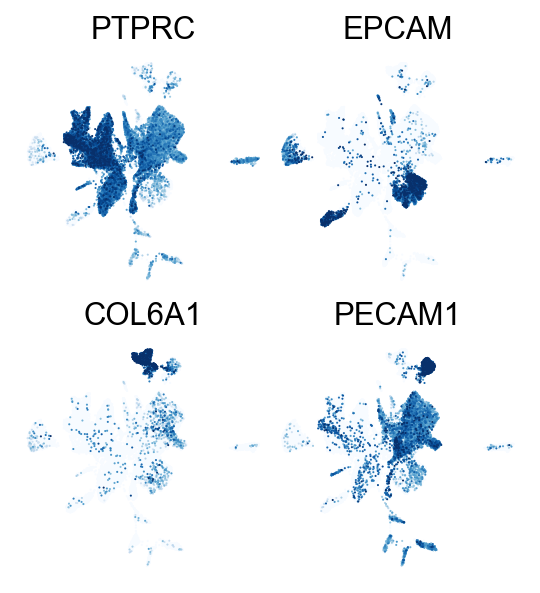

In [19]:
with plt.rc_context({'figure.figsize': (2,2)}):
    sc.pl.umap(cancer_Levantini, 
               color = ["PTPRC", "EPCAM", "COL6A1", "PECAM1"],
               legend_loc = "on data",
               ncols = 2, hspace = 0.2, wspace = 0,
               frameon = False,
               vmax = 'p99', vmin = 0.0001,
               color_map = "Blues", colorbar_loc = None,
               save = "1D-Levantini-marker.pdf")

In [20]:
cancer_Klein = sc.read_h5ad("1.ProcessedData/cancer_Klein_2019.h5ad")

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


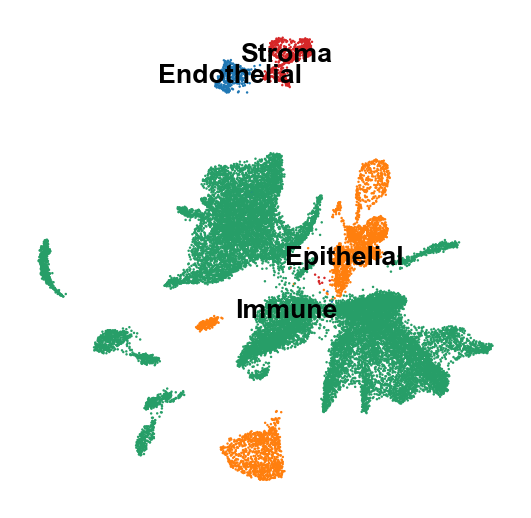

In [21]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(cancer_Klein, 
               color = "major_cell_type",
               title = "",
               legend_loc = "on data",
               legend_fontsize = 12,
               frameon = False,
               save = "1D-Klein-celltype.pdf")

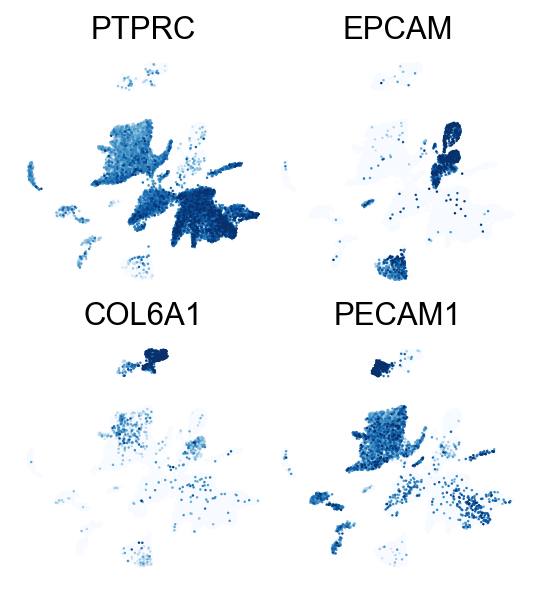

In [22]:
with plt.rc_context({'figure.figsize': (2,2)}):
    sc.pl.umap(cancer_Klein, 
               color = ["PTPRC", "EPCAM", "COL6A1", "PECAM1"],
               legend_loc = "on data",
               ncols = 2, hspace = 0.2, wspace = 0,
               frameon = False,
               vmax = 'p99', vmin = 0.0001,
               color_map = "Blues", colorbar_loc = None,
               save = "1D-Klein-marker.pdf")

In [24]:
cancer_Lambrechts = sc.read_h5ad("1.ProcessedData/cancer_Lambrechts_2020.h5ad")

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


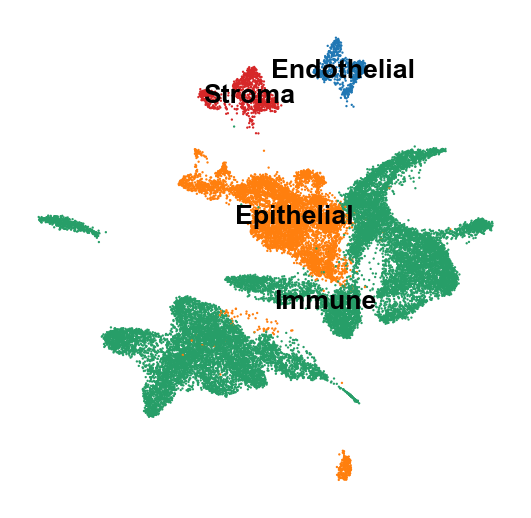

In [25]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(cancer_Lambrechts, 
               color = "major_cell_type",
               title = "",
               legend_loc = "on data",
               legend_fontsize = 12,
               frameon = False,
               save = "1D-Lambrechts-celltype.pdf")

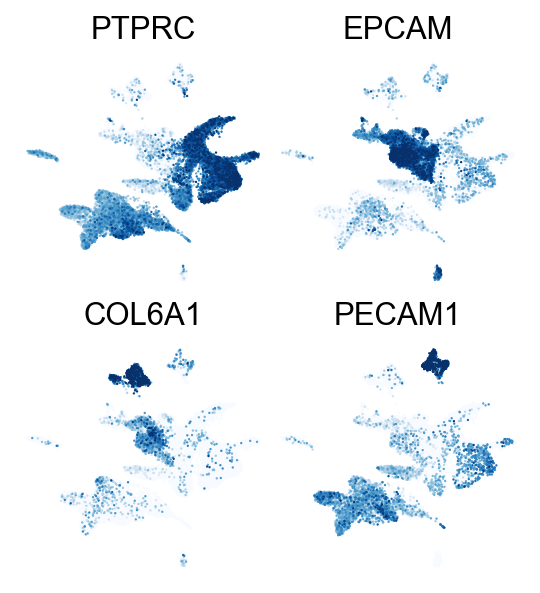

In [27]:
with plt.rc_context({'figure.figsize': (2,2)}):
    sc.pl.umap(cancer_Lambrechts, 
               color = ["PTPRC", "EPCAM", "COL6A1", "PECAM1"],
               legend_loc = "on data",
               ncols = 2, hspace = 0.2, wspace = 0,
               frameon = False,
               vmax = 'p99', vmin = 0.0001,
               color_map = "Blues", colorbar_loc = None,
               save = "1D-Lambrechts-marker.pdf")

### Figure 5 - Stroma/Endo cell counts

#### Figure 5A - Stroma/Endo counts vs. disease

In [6]:
stroma = sc.read_h5ad("2.BatchCorrection/stroma.h5ad")
stroma

AnnData object with n_obs × n_vars = 106638 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [11]:
stroma.obs["disease"].value_counts()

IPF         36665
normal      25217
COVID-19    24081
COPD        12654
cancer       8021
Name: disease, dtype: int64

In [8]:
endo = sc.read_h5ad("2.BatchCorrection/endo.h5ad")
endo

AnnData object with n_obs × n_vars = 97190 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [10]:
endo.obs["disease"].value_counts()

normal      48166
COPD        17805
IPF         13190
COVID-19    11199
cancer       6830
Name: disease, dtype: int64

#### Figure 5B - Major cell type frequency

In [3]:
cellcounts = pd.DataFrame(columns = ["Immune", "Stroma", "Epithelial", "Endothelial", "disease"])
cellcounts

,Immune,Stroma,Epithelial,Endothelial,disease


In [20]:
normal_hlca = sc.read_h5ad("1.ProcessedData/normal_core.h5ad")
data = normal_hlca.obs[["dataset","ann_level_1"]].groupby("dataset").value_counts()
data = data.reset_index(name = "count").pivot(index = "dataset", columns = "ann_level_1", values = "count")
data[["disease"]] = "normal"
cellcounts = pd.concat([cellcounts, data])
cellcounts

,Immune,Stroma,Epithelial,Endothelial,disease
Banovich_Kropski_2020,63392,3898,37109,17495,normal
Barbry_Leroy_2020,4044,785,67208,2450,normal
Jain_Misharin_2021_10Xv1,623,19,11780,0,normal
Jain_Misharin_2021_10Xv2,1997,34,31095,9,normal
Krasnow_2020,29943,5038,9395,16606,normal
Lafyatis_Rojas_2019_10Xv1,2481,30,321,89,normal
Lafyatis_Rojas_2019_10Xv2,15959,823,2322,2156,normal
Meyer_2019,28062,3169,3285,1038,normal
Misharin_2021,35116,9127,16064,4536,normal
Misharin_Budinger_2018,16853,186,23479,702,normal


In [21]:
copd_hlca = sc.read_h5ad("1.ProcessedData/copd_hlca.h5ad")
data = copd_hlca.obs[["dataset","ann_level_1"]].groupby("dataset").value_counts()
data = data.reset_index(name = "count").pivot(index = "dataset", columns = "ann_level_1", values = "count")
data[["disease"]] = "COPD"
cellcounts = pd.concat([cellcounts, data])
cellcounts

,Immune,Stroma,Epithelial,Endothelial,disease,Unknown
Banovich_Kropski_2020,63392,3898,37109,17495,normal,NaN
Barbry_Leroy_2020,4044,785,67208,2450,normal,NaN
Jain_Misharin_2021_10Xv1,623,19,11780,0,normal,NaN
Jain_Misharin_2021_10Xv2,1997,34,31095,9,normal,NaN
Krasnow_2020,29943,5038,9395,16606,normal,NaN
Lafyatis_Rojas_2019_10Xv1,2481,30,321,89,normal,NaN
Lafyatis_Rojas_2019_10Xv2,15959,823,2322,2156,normal,NaN
Meyer_2019,28062,3169,3285,1038,normal,NaN
Misharin_2021,35116,9127,16064,4536,normal,NaN
Misharin_Budinger_2018,16853,186,23479,702,normal,NaN


In [25]:
copd_Morrisey = sc.read_h5ad("1.ProcessedData/copd_Morrisey_2022.h5ad")
data = copd_Morrisey.obs["major_cell_type"].value_counts()
data = pd.DataFrame(data).transpose()
data[["disease"]] = "COPD"
data.index = ["Morrisey_2022"]
cellcounts = pd.concat([cellcounts, data])
cellcounts

,Immune,Stroma,Epithelial,Endothelial,disease,Unknown
Banovich_Kropski_2020,63392,3898,37109,17495,normal,NaN
Barbry_Leroy_2020,4044,785,67208,2450,normal,NaN
Jain_Misharin_2021_10Xv1,623,19,11780,0,normal,NaN
Jain_Misharin_2021_10Xv2,1997,34,31095,9,normal,NaN
Krasnow_2020,29943,5038,9395,16606,normal,NaN
Lafyatis_Rojas_2019_10Xv1,2481,30,321,89,normal,NaN
Lafyatis_Rojas_2019_10Xv2,15959,823,2322,2156,normal,NaN
Meyer_2019,28062,3169,3285,1038,normal,NaN
Misharin_2021,35116,9127,16064,4536,normal,NaN
Misharin_Budinger_2018,16853,186,23479,702,normal,NaN


In [26]:
copd_Yamamoto = sc.read_h5ad("1.ProcessedData/copd_Yamamoto_2022.h5ad")
data = copd_Yamamoto.obs["major_cell_type"].value_counts()
data = pd.DataFrame(data).transpose()
data[["disease"]] = "COPD"
data.index = ["Yamamoto_2022"]
cellcounts = pd.concat([cellcounts, data])
cellcounts

,Immune,Stroma,Epithelial,Endothelial,disease,Unknown
Banovich_Kropski_2020,63392,3898,37109,17495,normal,NaN
Barbry_Leroy_2020,4044,785,67208,2450,normal,NaN
Jain_Misharin_2021_10Xv1,623,19,11780,0,normal,NaN
Jain_Misharin_2021_10Xv2,1997,34,31095,9,normal,NaN
Krasnow_2020,29943,5038,9395,16606,normal,NaN
Lafyatis_Rojas_2019_10Xv1,2481,30,321,89,normal,NaN
Lafyatis_Rojas_2019_10Xv2,15959,823,2322,2156,normal,NaN
Meyer_2019,28062,3169,3285,1038,normal,NaN
Misharin_2021,35116,9127,16064,4536,normal,NaN
Misharin_Budinger_2018,16853,186,23479,702,normal,NaN


In [27]:
ipf_hlca = sc.read_h5ad("1.ProcessedData/ipf.h5ad")
data = ipf_hlca.obs[["dataset","ann_level_1"]].groupby("dataset").value_counts()
data = data.reset_index(name = "count").pivot(index = "dataset", columns = "ann_level_1", values = "count")
data[["disease"]] = "IPF"
cellcounts = pd.concat([cellcounts, data])
cellcounts

,Immune,Stroma,Epithelial,Endothelial,disease,Unknown
Banovich_Kropski_2020,63392,3898,37109,17495,normal,NaN
Barbry_Leroy_2020,4044,785,67208,2450,normal,NaN
Jain_Misharin_2021_10Xv1,623,19,11780,0,normal,NaN
Jain_Misharin_2021_10Xv2,1997,34,31095,9,normal,NaN
Krasnow_2020,29943,5038,9395,16606,normal,NaN
Lafyatis_Rojas_2019_10Xv1,2481,30,321,89,normal,NaN
Lafyatis_Rojas_2019_10Xv2,15959,823,2322,2156,normal,NaN
Meyer_2019,28062,3169,3285,1038,normal,NaN
Misharin_2021,35116,9127,16064,4536,normal,NaN
Misharin_Budinger_2018,16853,186,23479,702,normal,NaN


In [28]:
covid_hlca = sc.read_h5ad("1.ProcessedData/covid.h5ad")
data = covid_hlca.obs[["dataset","ann_level_1"]].groupby("dataset").value_counts()
data = data.reset_index(name = "count").pivot(index = "dataset", columns = "ann_level_1", values = "count")
data[["disease"]] = "COVID-19"
cellcounts = pd.concat([cellcounts, data])
cellcounts

,Immune,Stroma,Epithelial,Endothelial,disease,Unknown
Banovich_Kropski_2020,63392,3898,37109,17495,normal,NaN
Barbry_Leroy_2020,4044,785,67208,2450,normal,NaN
Jain_Misharin_2021_10Xv1,623,19,11780,0,normal,NaN
Jain_Misharin_2021_10Xv2,1997,34,31095,9,normal,NaN
Krasnow_2020,29943,5038,9395,16606,normal,NaN
Lafyatis_Rojas_2019_10Xv1,2481,30,321,89,normal,NaN
Lafyatis_Rojas_2019_10Xv2,15959,823,2322,2156,normal,NaN
Meyer_2019,28062,3169,3285,1038,normal,NaN
Misharin_2021,35116,9127,16064,4536,normal,NaN
Misharin_Budinger_2018,16853,186,23479,702,normal,NaN


In [29]:
cancer_hlca = sc.read_h5ad("1.ProcessedData/cancer_hlca.h5ad")
data = cancer_hlca.obs[["dataset","ann_level_1"]].groupby("dataset").value_counts()
data = data.reset_index(name = "count").pivot(index = "dataset", columns = "ann_level_1", values = "count")
data[["disease"]] = "cancer"
cellcounts = pd.concat([cellcounts, data])
cellcounts

,Immune,Stroma,Epithelial,Endothelial,disease,Unknown
Banovich_Kropski_2020,63392,3898,37109,17495,normal,NaN
Barbry_Leroy_2020,4044,785,67208,2450,normal,NaN
Jain_Misharin_2021_10Xv1,623,19,11780,0,normal,NaN
Jain_Misharin_2021_10Xv2,1997,34,31095,9,normal,NaN
Krasnow_2020,29943,5038,9395,16606,normal,NaN
Lafyatis_Rojas_2019_10Xv1,2481,30,321,89,normal,NaN
Lafyatis_Rojas_2019_10Xv2,15959,823,2322,2156,normal,NaN
Meyer_2019,28062,3169,3285,1038,normal,NaN
Misharin_2021,35116,9127,16064,4536,normal,NaN
Misharin_Budinger_2018,16853,186,23479,702,normal,NaN


In [30]:
cancer_Lee = sc.read_h5ad("1.ProcessedData/cancer_Lee_2020.h5ad")
data = cancer_Lee.obs["major_cell_type"].value_counts()
data = pd.DataFrame(data).transpose()
data[["disease"]] = "cancer"
data.index = ["Lee_2020"]
cellcounts = pd.concat([cellcounts, data])
cellcounts

,Immune,Stroma,Epithelial,Endothelial,disease,Unknown
Banovich_Kropski_2020,63392,3898,37109,17495,normal,NaN
Barbry_Leroy_2020,4044,785,67208,2450,normal,NaN
Jain_Misharin_2021_10Xv1,623,19,11780,0,normal,NaN
Jain_Misharin_2021_10Xv2,1997,34,31095,9,normal,NaN
Krasnow_2020,29943,5038,9395,16606,normal,NaN
Lafyatis_Rojas_2019_10Xv1,2481,30,321,89,normal,NaN
Lafyatis_Rojas_2019_10Xv2,15959,823,2322,2156,normal,NaN
Meyer_2019,28062,3169,3285,1038,normal,NaN
Misharin_2021,35116,9127,16064,4536,normal,NaN
Misharin_Budinger_2018,16853,186,23479,702,normal,NaN


In [31]:
cancer_Klauschen = sc.read_h5ad("1.ProcessedData/cancer_Klauschen_2021.h5ad")
data = cancer_Klauschen.obs["major_cell_type"].value_counts()
data = pd.DataFrame(data).transpose()
data[["disease"]] = "cancer"
data.index = ["Klauschen_2021"]
cellcounts = pd.concat([cellcounts, data])
cellcounts

,Immune,Stroma,Epithelial,Endothelial,disease,Unknown
Banovich_Kropski_2020,63392,3898,37109,17495,normal,NaN
Barbry_Leroy_2020,4044,785,67208,2450,normal,NaN
Jain_Misharin_2021_10Xv1,623,19,11780,0,normal,NaN
Jain_Misharin_2021_10Xv2,1997,34,31095,9,normal,NaN
Krasnow_2020,29943,5038,9395,16606,normal,NaN
Lafyatis_Rojas_2019_10Xv1,2481,30,321,89,normal,NaN
Lafyatis_Rojas_2019_10Xv2,15959,823,2322,2156,normal,NaN
Meyer_2019,28062,3169,3285,1038,normal,NaN
Misharin_2021,35116,9127,16064,4536,normal,NaN
Misharin_Budinger_2018,16853,186,23479,702,normal,NaN


In [32]:
cancer_Levantini = sc.read_h5ad("1.ProcessedData/cancer_Levantini_2021.h5ad")
data = cancer_Levantini.obs["major_cell_type"].value_counts()
data = pd.DataFrame(data).transpose()
data[["disease"]] = "cancer"
data.index = ["Levantini_2021"]
cellcounts = pd.concat([cellcounts, data])
cellcounts

,Immune,Stroma,Epithelial,Endothelial,disease,Unknown
Banovich_Kropski_2020,63392,3898,37109,17495,normal,NaN
Barbry_Leroy_2020,4044,785,67208,2450,normal,NaN
Jain_Misharin_2021_10Xv1,623,19,11780,0,normal,NaN
Jain_Misharin_2021_10Xv2,1997,34,31095,9,normal,NaN
Krasnow_2020,29943,5038,9395,16606,normal,NaN
Lafyatis_Rojas_2019_10Xv1,2481,30,321,89,normal,NaN
Lafyatis_Rojas_2019_10Xv2,15959,823,2322,2156,normal,NaN
Meyer_2019,28062,3169,3285,1038,normal,NaN
Misharin_2021,35116,9127,16064,4536,normal,NaN
Misharin_Budinger_2018,16853,186,23479,702,normal,NaN


In [33]:
cancer_Klein = sc.read_h5ad("1.ProcessedData/cancer_Klein_2019.h5ad")
data = cancer_Klein.obs["major_cell_type"].value_counts()
data = pd.DataFrame(data).transpose()
data[["disease"]] = "cancer"
data.index = ["Klein_2019"]
cellcounts = pd.concat([cellcounts, data])
cellcounts

,Immune,Stroma,Epithelial,Endothelial,disease,Unknown
Banovich_Kropski_2020,63392,3898,37109,17495,normal,NaN
Barbry_Leroy_2020,4044,785,67208,2450,normal,NaN
Jain_Misharin_2021_10Xv1,623,19,11780,0,normal,NaN
Jain_Misharin_2021_10Xv2,1997,34,31095,9,normal,NaN
Krasnow_2020,29943,5038,9395,16606,normal,NaN
Lafyatis_Rojas_2019_10Xv1,2481,30,321,89,normal,NaN
Lafyatis_Rojas_2019_10Xv2,15959,823,2322,2156,normal,NaN
Meyer_2019,28062,3169,3285,1038,normal,NaN
Misharin_2021,35116,9127,16064,4536,normal,NaN
Misharin_Budinger_2018,16853,186,23479,702,normal,NaN


In [34]:
cancer_Lambrechts = sc.read_h5ad("1.ProcessedData/cancer_Lambrechts_2020.h5ad")
data = cancer_Lambrechts.obs["major_cell_type"].value_counts()
data = pd.DataFrame(data).transpose()
data[["disease"]] = "cancer"
data.index = ["Lambrechts_2020"]
cellcounts = pd.concat([cellcounts, data])
cellcounts

,Immune,Stroma,Epithelial,Endothelial,disease,Unknown
Banovich_Kropski_2020,63392,3898,37109,17495,normal,NaN
Barbry_Leroy_2020,4044,785,67208,2450,normal,NaN
Jain_Misharin_2021_10Xv1,623,19,11780,0,normal,NaN
Jain_Misharin_2021_10Xv2,1997,34,31095,9,normal,NaN
Krasnow_2020,29943,5038,9395,16606,normal,NaN
Lafyatis_Rojas_2019_10Xv1,2481,30,321,89,normal,NaN
Lafyatis_Rojas_2019_10Xv2,15959,823,2322,2156,normal,NaN
Meyer_2019,28062,3169,3285,1038,normal,NaN
Misharin_2021,35116,9127,16064,4536,normal,NaN
Misharin_Budinger_2018,16853,186,23479,702,normal,NaN


In [35]:
cellcounts.to_csv("Figure/Fig5/cellcounts.csv")

### Figure 6 - Batch correction (Stroma)

In [8]:
celltype_cols = ['#a6cee3',
                 '#1f78b4',
                 '#33a02c',
                 '#fb9a99',
                 '#fdbf6f',
                 '#ff7f00',
                 '#6a3d9a',
                 '#ffff99',
                 '#808080']

In [6]:
marker_genes_dict = ['COL1A1', 'PDGFRA', 
                     'PI16', 'NPNT', 'CCL2', 'KRT8', 'CTHRC1', 
                     'ACTA2', 'MCAM',
                     'PDGFRB', 'MYH11']

In [118]:
stroma = sc.read_h5ad("2.BatchCorrection/stroma_bbknn.h5ad")
stroma

AnnData object with n_obs × n_vars = 106638 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


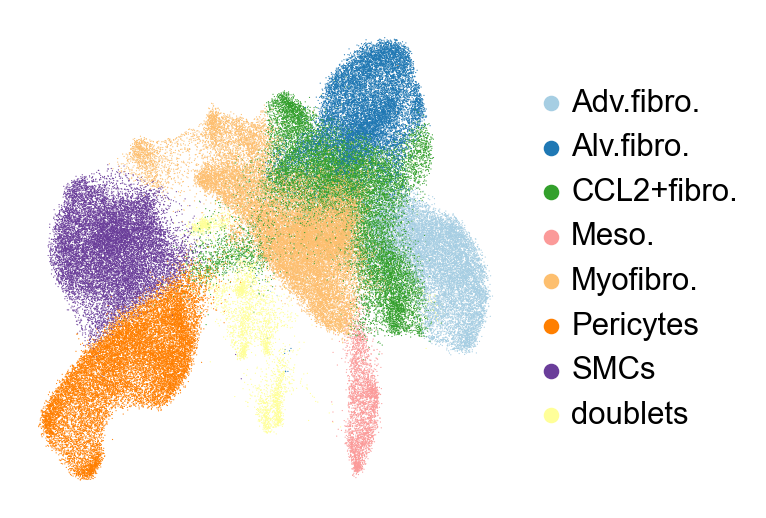

In [77]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(stroma, 
               color = "minor_cell_type",
               title = "",
               palette = celltype_cols,
               legend_fontsize = 14,
               frameon = False,
               save = "6A_stroma_bbknn.pdf")

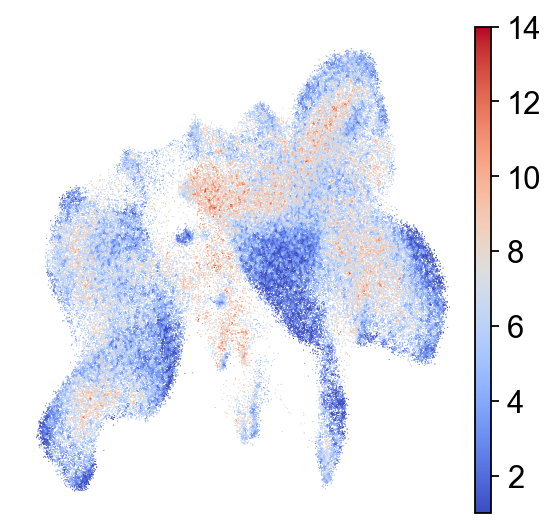

In [45]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(stroma, 
               color = "batch_variety",
               title = "",
               cmap = "coolwarm",
               frameon = False,
               save = "6A_stroma_bbknn_batch.pdf")

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


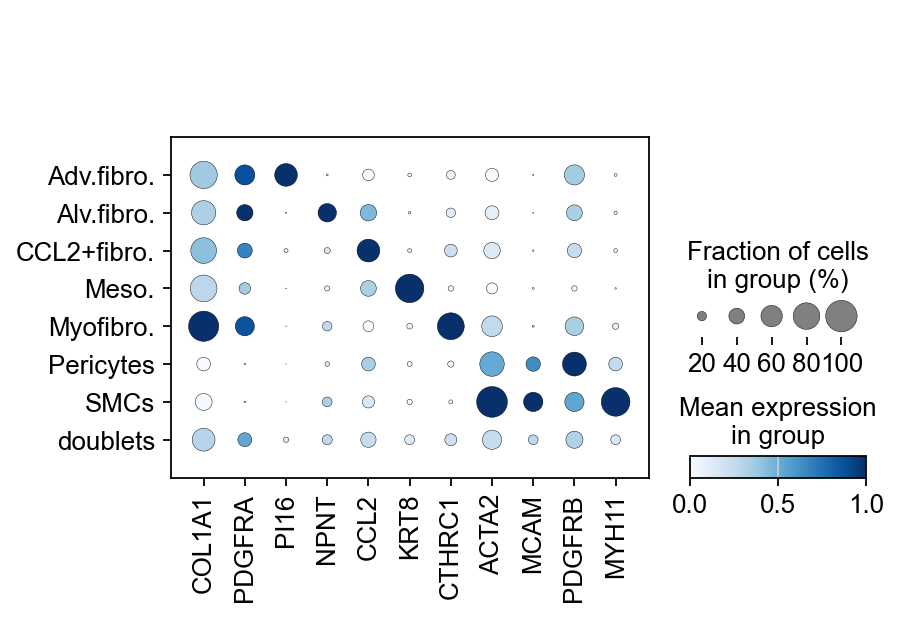

In [119]:
with plt.rc_context({'figure.figsize': (8,4)}):
    sc.pl.dotplot(stroma, 
                  marker_genes_dict,
                  groupby = "minor_cell_type",
                  dendrogram = False,
                  color_map = "Blues",
                  swap_axes = False,
                  use_raw = True,
                  standard_scale = "var",
                  save = "6A_stroma_bbknn_dot.pdf")

In [3]:
stroma = sc.read_h5ad("2.BatchCorrection/stroma_harmony.h5ad")
stroma

AnnData object with n_obs × n_vars = 106638 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


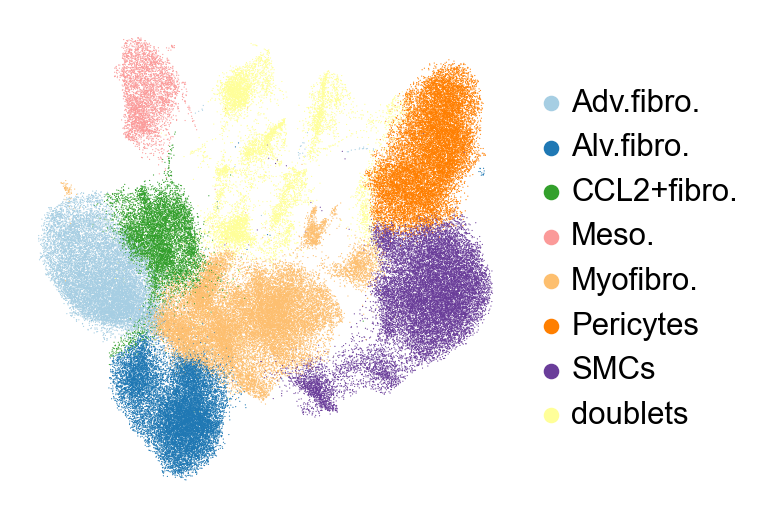

In [9]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(stroma, 
               color = "minor_cell_type",
               title = "",
               palette = celltype_cols,
               legend_fontsize = 14,
               frameon = False,
               save = "6A_stroma_harmony.pdf")

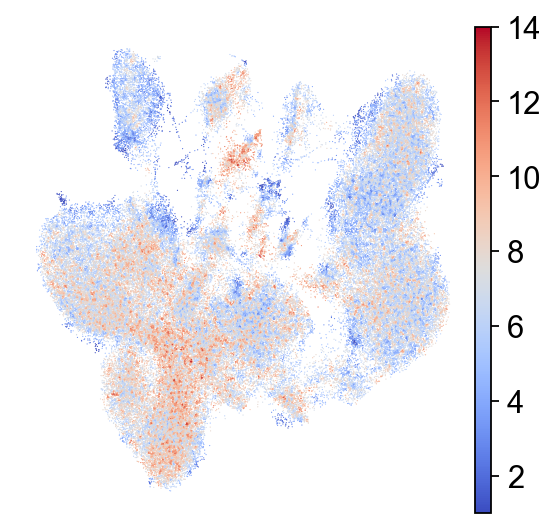

In [50]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(stroma, 
               color = "batch_variety",
               title = "",
               cmap = "coolwarm",
               frameon = False,
               save = "6A_stroma_harmony_batch.pdf")

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


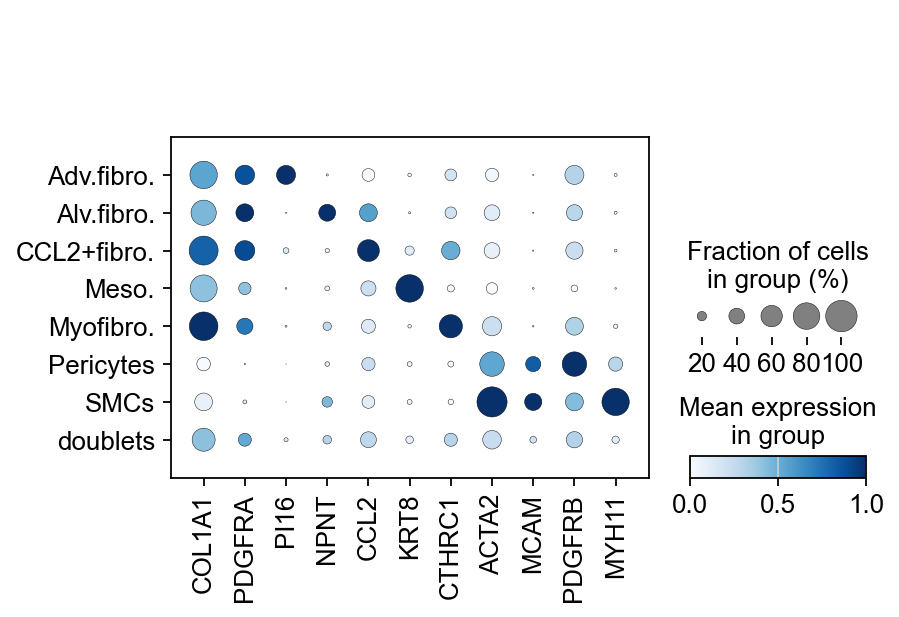

In [10]:
with plt.rc_context({'figure.figsize': (8,4)}):
    sc.pl.dotplot(stroma, 
                  marker_genes_dict,
                  groupby = "minor_cell_type",
                  dendrogram = False,
                  color_map = "Blues",
                  swap_axes = False,
                  use_raw = True,
                  standard_scale = "var",
                  save = "6A_stroma_harmony_dot.pdf")

In [11]:
stroma = sc.read_h5ad("2.BatchCorrection/stroma_scanorama.h5ad")
stroma

AnnData object with n_obs × n_vars = 106638 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R_colors', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_scanorama', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


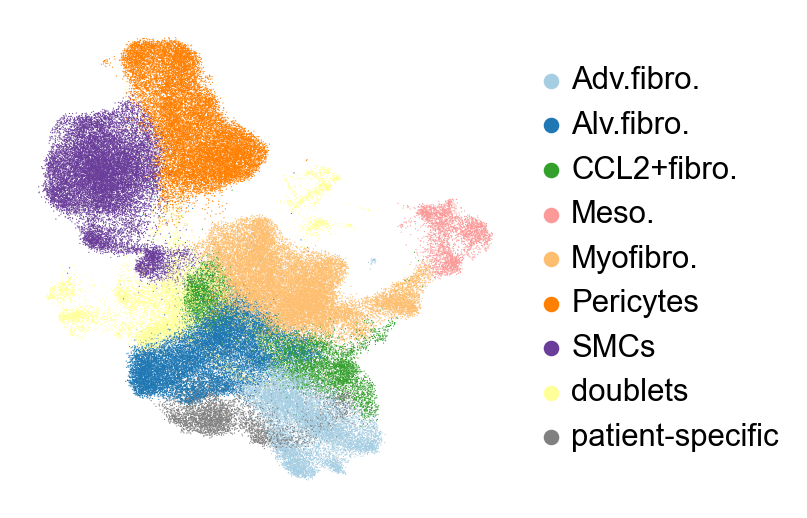

In [12]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(stroma, 
               color = "minor_cell_type",
               title = "",
               legend_fontsize = 14,
               palette = celltype_cols,
               frameon = False,
               save = "6A_stroma_scanorama.pdf")

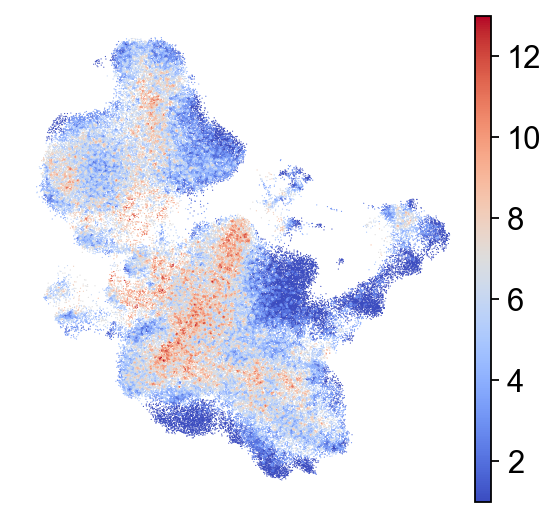

In [57]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(stroma, 
               color = "batch_variety",
               title = "",
               cmap = "coolwarm",
               frameon = False,
               save = "6A_stroma_scanorama_batch.pdf")

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


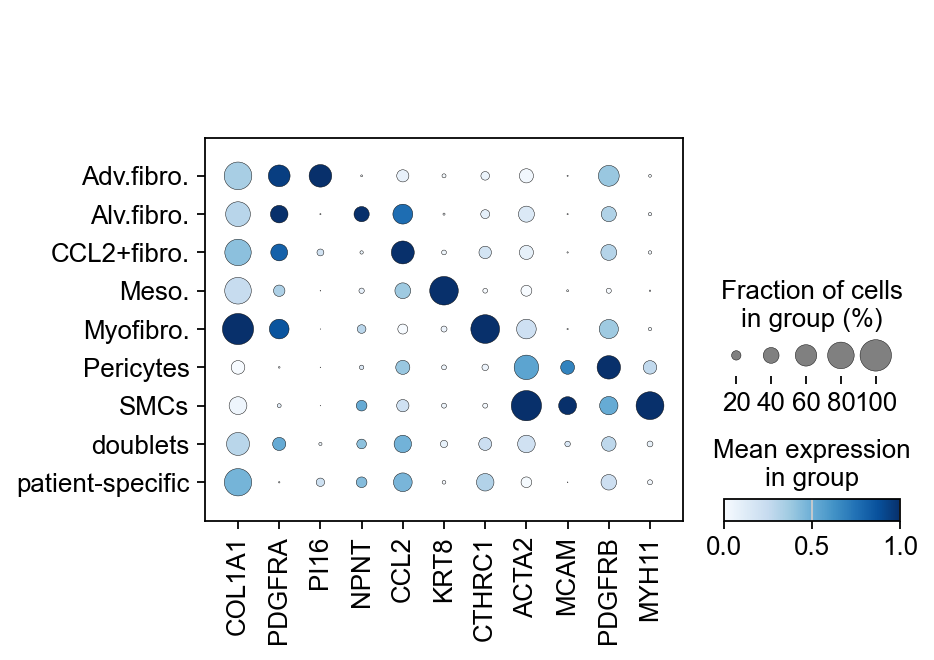

In [13]:
with plt.rc_context({'figure.figsize': (8,4)}):
    sc.pl.dotplot(stroma, 
                  marker_genes_dict,
                  groupby = "minor_cell_type",
                  dendrogram = False,
                  color_map = "Blues",
                  swap_axes = False,
                  use_raw = True,
                  standard_scale = "var",
                  save = "6A_stroma_scanorama_dot.pdf")

### Figure 7 - Batch correction (Endo)

In [36]:
marker_genes_dict = ["GJA5", "PROX1", 
                     "CA4", "HPGD", "FCN3",
                     "ACKR1", "COL15A1"]

In [149]:
endo = sc.read_h5ad("2.BatchCorrection/endo_bbknn.h5ad")
endo

AnnData object with n_obs × n_vars = 97190 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


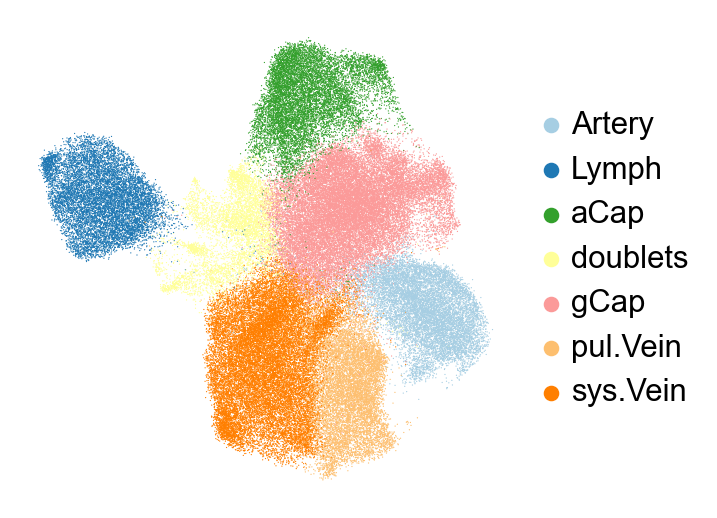

In [127]:
celltype_cols = ['#a6cee3',
                 '#1f78b4',
                 '#33a02c',
                 '#ffff99',
                 '#fb9a99',
                 '#fdbf6f',
                 '#ff7f00']
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(endo, 
               color = "minor_cell_type",
               title = "",
               legend_fontsize = 14,
               palette = celltype_cols,
               frameon = False,
               save = "7A_endo_bbknn.pdf")

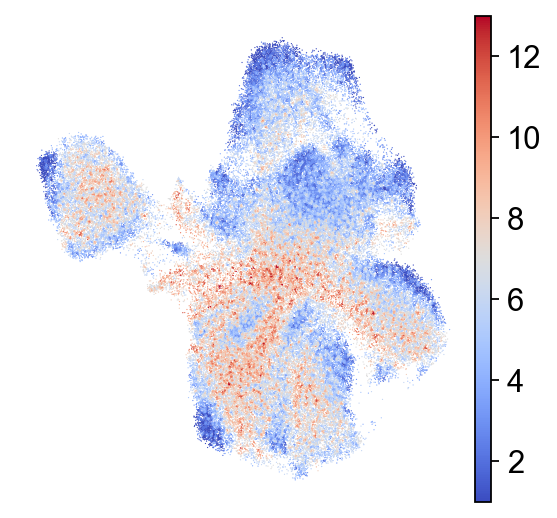

In [150]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(endo, 
               color = "batch_variety",
               title = "",
               cmap = "coolwarm",
               frameon = False,
               save = "7A_endo_bbknn_batch.pdf")

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


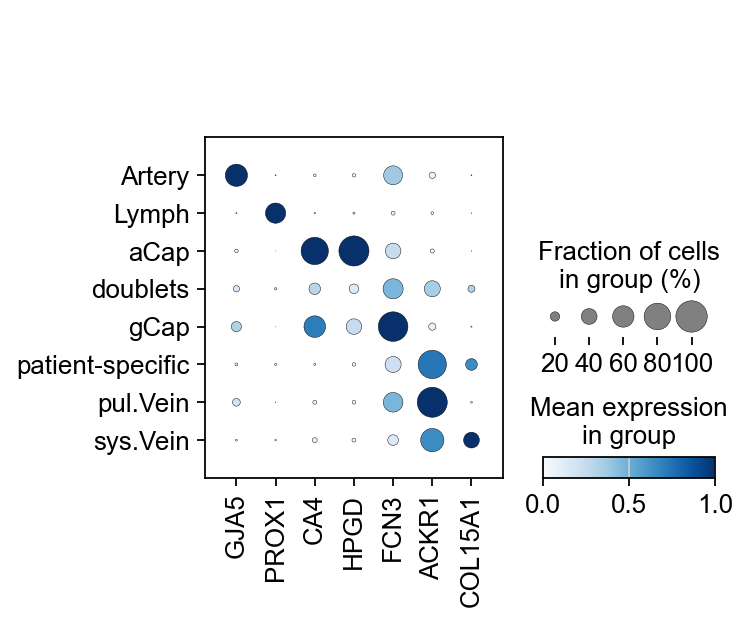

In [37]:
with plt.rc_context({'figure.figsize': (8,4)}):
    sc.pl.dotplot(endo, 
                  marker_genes_dict,
                  groupby = "minor_cell_type",
                  dendrogram = False,
                  color_map = "Blues",
                  swap_axes = False,
                  use_raw = True,
                  standard_scale = "var",
                  save = "7A_endo_bbknn_dot.pdf")

In [33]:
endo = sc.read_h5ad("2.BatchCorrection/endo_harmony.h5ad")
endo

AnnData object with n_obs × n_vars = 97190 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


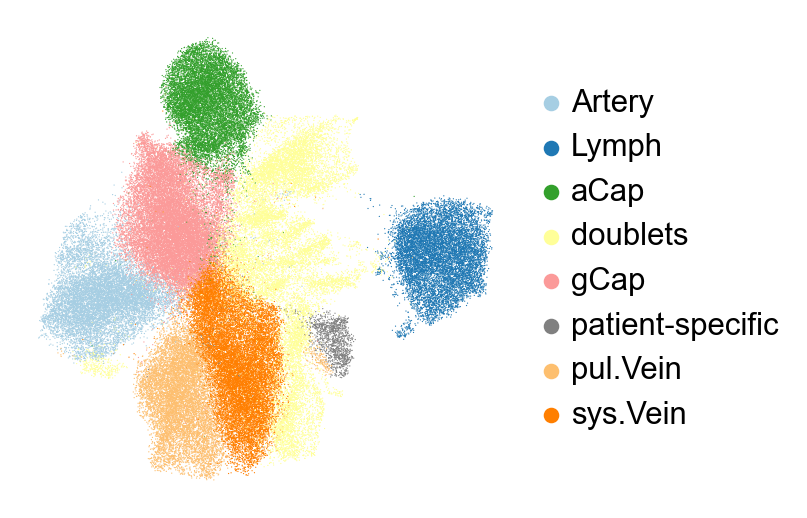

In [34]:
celltype_cols = ['#a6cee3',
                 '#1f78b4',
                 '#33a02c',
                 '#ffff99',
                 '#fb9a99',
                 '#808080',
                 '#fdbf6f',
                 '#ff7f00']
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(endo, 
               color = "minor_cell_type",
               title = "",
               legend_fontsize = 14,
               palette = celltype_cols,
               frameon = False,
               save = "7A_endo_harmony.pdf")

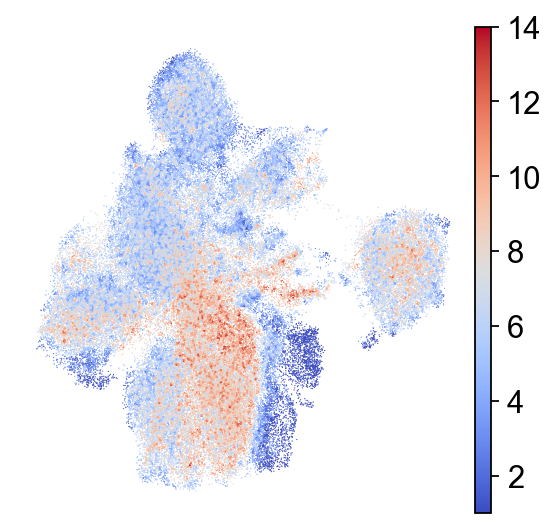

In [6]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(endo, 
               color = "batch_variety",
               title = "",
               cmap = "coolwarm",
               frameon = False,
               save = "7A_endo_harmony_batch.pdf")

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


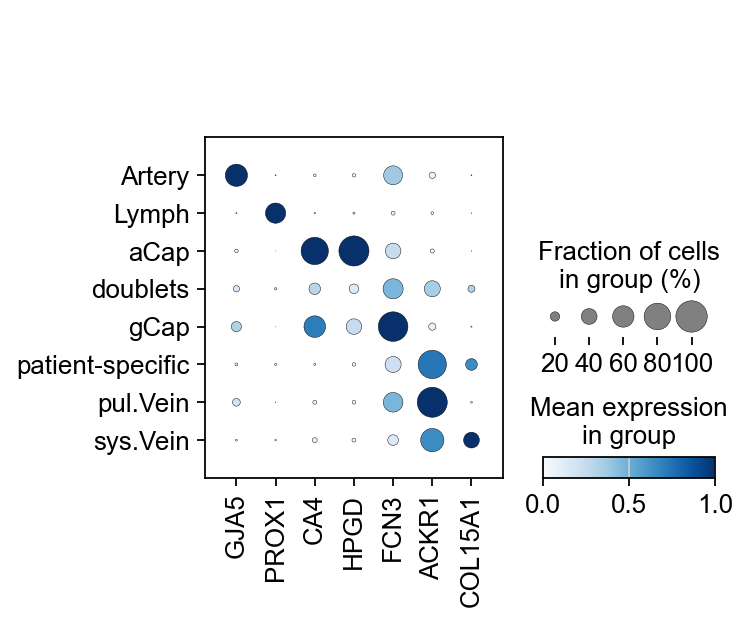

In [38]:
with plt.rc_context({'figure.figsize': (8,4)}):
    sc.pl.dotplot(endo,
                  marker_genes_dict,
                  groupby = "minor_cell_type",
                  dendrogram = False,
                  color_map = "Blues",
                  swap_axes = False,
                  use_raw = True,
                  standard_scale = "var",
                  save = "7A_endo_harmony_dot.pdf")

In [16]:
endo = sc.read_h5ad("2.BatchCorrection/endo_scanorama.h5ad")
endo

AnnData object with n_obs × n_vars = 97190 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'leiden_R', 'minor_cell_type', 'batch_variety'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R_colors', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_scanorama', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


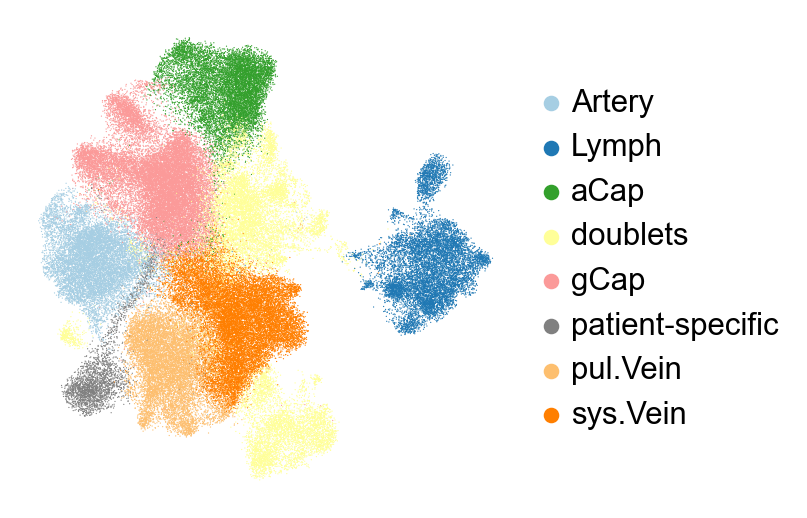

In [17]:
celltype_cols = ['#a6cee3',
                 '#1f78b4',
                 '#33a02c',
                 '#ffff99',
                 '#fb9a99',
                 '#808080',
                 '#fdbf6f',
                 '#ff7f00']
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(endo, 
               color = "minor_cell_type",
               title = "",
               legend_fontsize = 14,
               palette = celltype_cols,
               frameon = False,
               save = "7A_endo_scanorama.pdf")

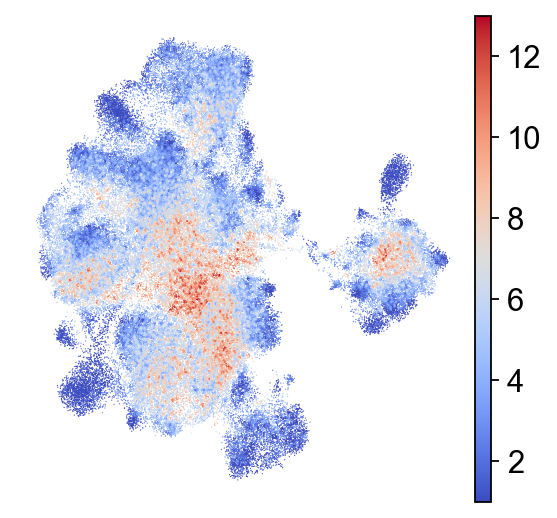

In [147]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(endo, 
               color = "batch_variety",
               title = "",
               cmap = "coolwarm",
               frameon = False,
               save = "7A_endo_scanorama_batch.pdf")

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


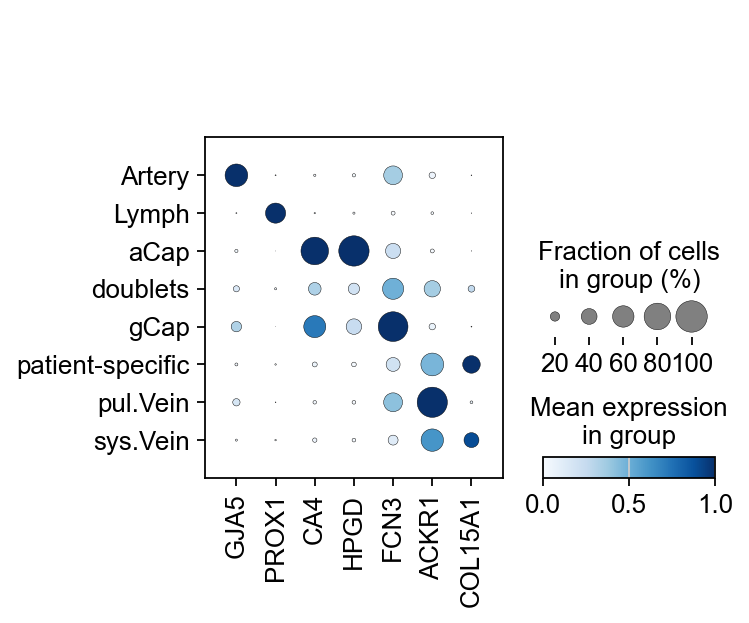

In [18]:
with plt.rc_context({'figure.figsize': (8,4)}):
    sc.pl.dotplot(endo, 
                  marker_genes_dict,
                  groupby = "minor_cell_type",
                  dendrogram = False,
                  color_map = "Blues",
                  swap_axes = False,
                  use_raw = True,
                  standard_scale = "var",
                  save = "7A_endo_scanorama_dot.pdf")

### Figure 9 - Stroma clustering

In [27]:
stroma = sc.read_h5ad("3.Stroma/Stroma.h5ad")
stroma

AnnData object with n_obs × n_vars = 97822 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R', 'leiden_R2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R2_colors', 'leiden_R_colors', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


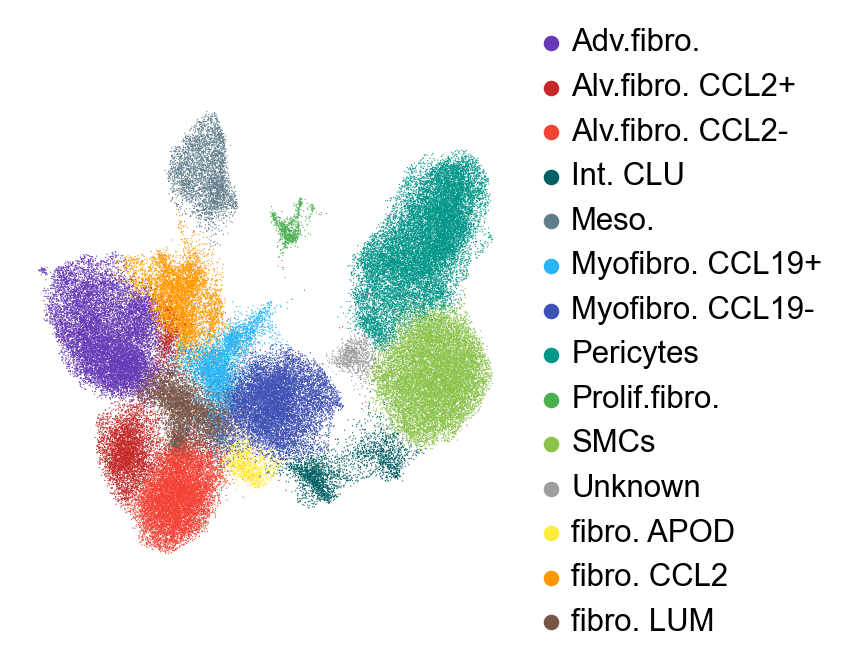

In [65]:
celltype_cols = ["#673AB7", "#C62828", "#F44336", "#006064",
                 "#607D8B", "#29B6F6", "#3F51B5", "#009688", 
                 "#4CAF50", "#8BC34A", "#9E9E9E", "#FFEB3B", 
                 "#FF9800", "#795548"]
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(stroma, 
               color = "minor_cell_type",
               title = "",
               legend_fontsize = 14,
               palette = celltype_cols,
               frameon = False,
               save = "9A-stroma.pdf")

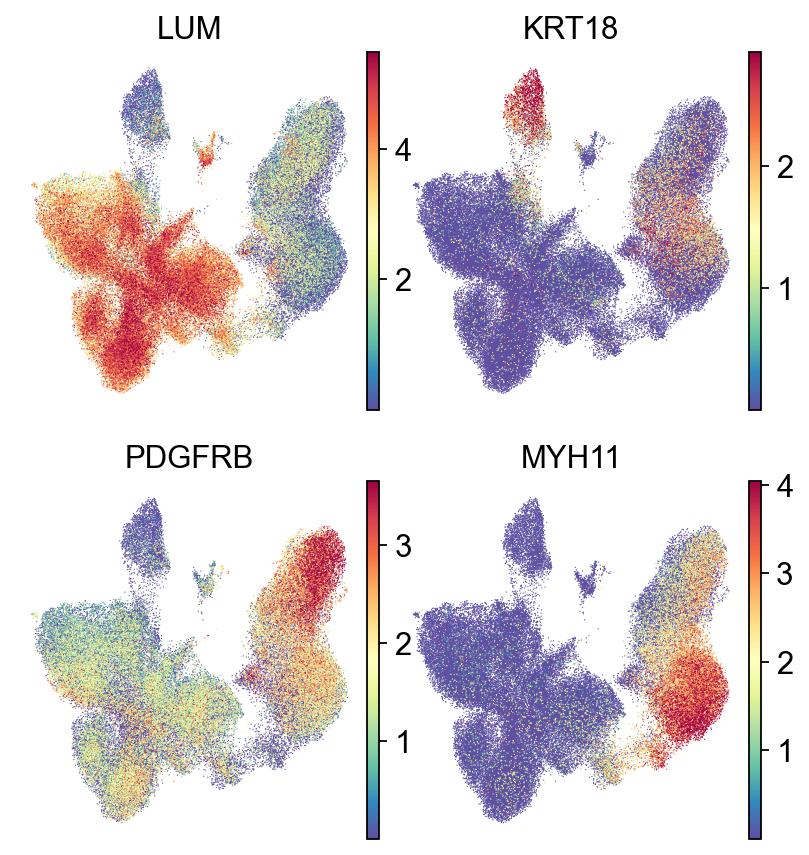

In [62]:
with plt.rc_context({'figure.figsize': (3,3)}):
    sc.pl.umap(stroma, 
               color = ["LUM", "KRT18", "PDGFRB", "MYH11"],
               ncols = 2, hspace = 0.2, wspace = 0,
               frameon = False,
               vmax = 'p99', vmin = 0.0001,
               color_map = "Spectral_r",
               save = "9B-major_lineage.pdf")

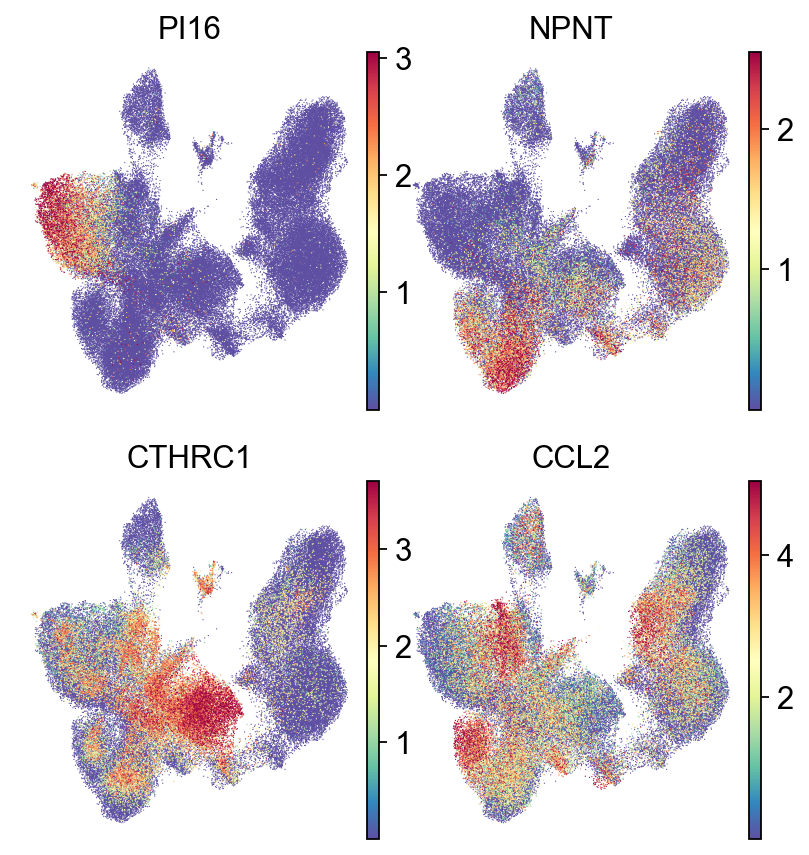

In [28]:
with plt.rc_context({'figure.figsize': (3,3)}):
    sc.pl.umap(stroma, 
               color = ["PI16", "NPNT", "CTHRC1", "CCL2"],
               ncols = 2, hspace = 0.2, wspace = 0,
               frameon = False,
               vmax = 'p99', vmin = 0.0001,
               color_map = "Spectral_r",
               save = "9C-fibro_lineage.pdf")

In [44]:
# Marker gene plot
marker_genes_dict = ["PI16", "MFAP5", "PCOLCE2",
                     "CCL2", "ICAM1", "NABP1",
                     "FGFR4", "LIMCH1", "GPC3",
                     "CCL19", "TDO2", "COL3A1",
                     "POSTN", "COL1A1", "CTHRC1",
                     "F13A1", "PENK", "DIO2",
                     "MEDAG", "CXCL2", "GPRC5A",
                     "LUM", "DCN", "PTGDS",
                     "MKI67", "BIRC5", "CENPF",
                     "HIGD1B", "COX4I2", "ADGRF5",
                     "RERGL", "MYH11", "DES",
                     "UPK3B", "ITLN1", "CALB2",
                     "WIF1", "SCX", "PCSK1N",
                     "ADIRF", "MT2A", "PTMA"]

In [52]:
# Marker gene plot
marker_genes_dict = ["PI16", "MFAP5",
                     "CCL2", "ICAM1",
                     "FGFR4", "LIMCH1",
                     "CCL19", "TDO2",
                     "POSTN", "COL1A1",
                     "F13A1", "PENK",
                     "MEDAG", "CXCL2",
                     "LUM", "DCN",
                     "MKI67", "BIRC5",
                     "HIGD1B", "COX4I2",
                     "RERGL", "MYH11",
                     "UPK3B", "ITLN1",
                     "WIF1", "SCX",
                     "ADIRF", "MT2A"]

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


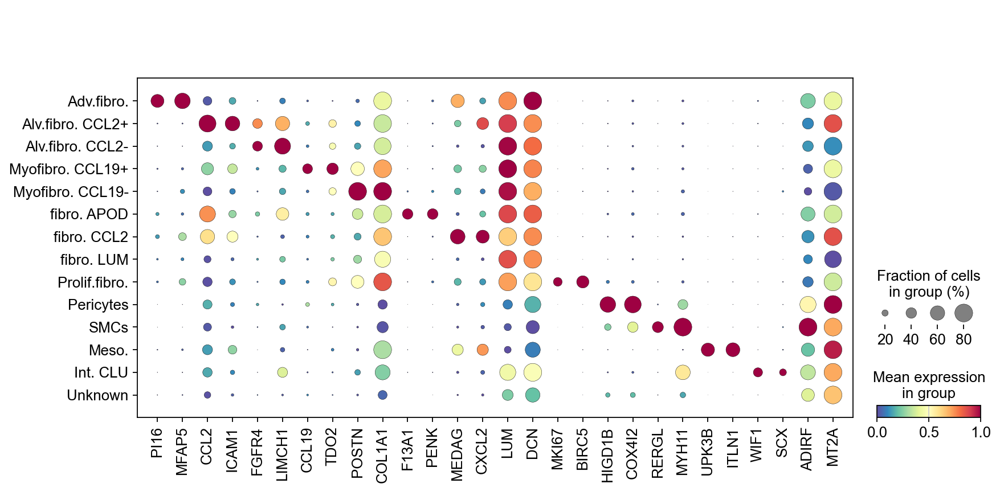

In [61]:
celltype = ["Adv.fibro.", 
            "Alv.fibro. CCL2+",
            "Alv.fibro. CCL2-",
            "Myofibro. CCL19+",
            "Myofibro. CCL19-",
            "fibro. APOD",
            "fibro. CCL2",
            "fibro. LUM",
            "Prolif.fibro.",
            "Pericytes",
            "SMCs",
            "Meso.",
            "Int. CLU",
            "Unknown"]

with plt.rc_context({'figure.figsize': (12,8)}):
    sc.pl.dotplot(stroma, 
                  marker_genes_dict,
                  groupby = "minor_cell_type",
                  dendrogram = False, 
                  categories_order = celltype,
                  color_map = "Spectral_r",
                  dot_max = 0.8,
                  swap_axes = False,
                  standard_scale = "var",
                  save = "9D_stroma_dot.pdf")

### Figure 10 - Stroma subtype DEG

#### Figure 10A-C Alv.fibro.

In [9]:
# Volcano plot
marker = pd.read_csv("3.Stroma/alv_marker.csv")
marker = marker.iloc[:, 4:8]
marker.columns = ['names', 'pvals_adj', 'logfoldchange', 'scores']
marker = marker[marker["pvals_adj"] < 0.05]
marker = marker.sort_values(axis = 0, by = "logfoldchange")
marker.head(20)

,names,pvals_adj,logfoldchange,scores
16224,KIAA0408,4.119332e-02,-1.422221,-2.533576
16292,REM1,5.590330e-03,-1.422025,-3.226189
16367,ING4,1.360527e-04,-1.296530,-4.231418
16259,ZNF33B,1.577809e-02,-1.267573,-2.887269
16280,TMEM74B,7.871939e-03,-1.223328,-3.117804
16584,PLEKHH2,2.480202e-180,-1.218235,-28.827438
16403,TMEM37,3.642660e-06,-1.191559,-5.024520
16542,MEOX2,1.915215e-30,-1.189609,-11.754187
16233,S1PR1,3.421396e-02,-1.179287,-2.605447
16426,ABCA10,2.767982e-07,-1.146643,-5.520808


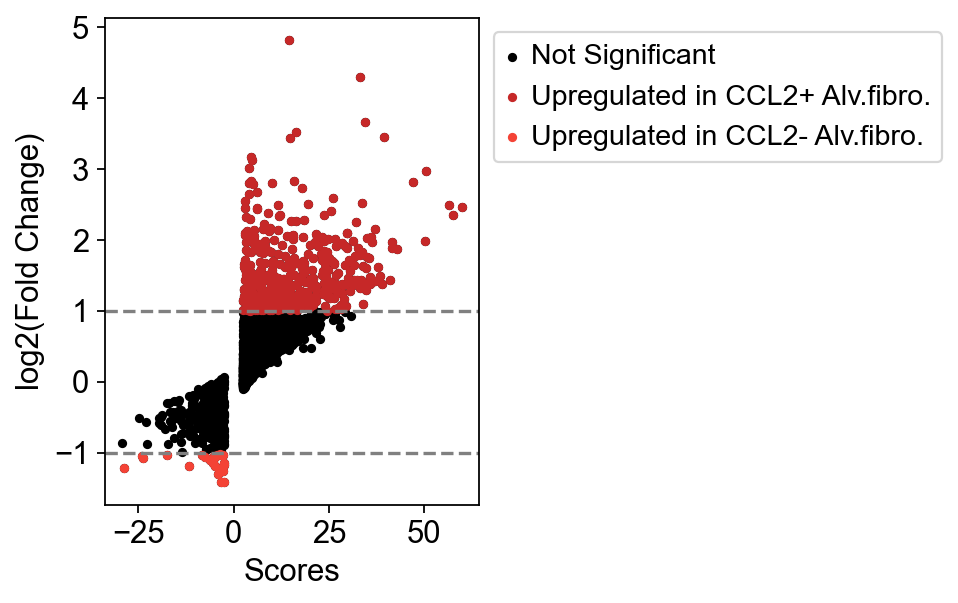

In [13]:
lfc_threshold = 1.0

lfc = marker['logfoldchange']
scores = marker['scores']

plt.figure(figsize = (3,4))
plt.scatter(scores, lfc, c='black', s = 10, label='Not Significant')
plt.scatter(scores[lfc > lfc_threshold], lfc[lfc > lfc_threshold],
            s = 10, c='#C62828', label='Upregulated in CCL2+ Alv.fibro.')
plt.scatter(scores[lfc < -lfc_threshold], lfc[lfc < -lfc_threshold],
            s = 10, c='#F44336', label='Upregulated in CCL2- Alv.fibro.')

plt.axhline(y=lfc_threshold, color='gray', linestyle='--')
plt.axhline(y=-lfc_threshold, color='gray', linestyle='--')

plt.xlabel('Scores')
plt.ylabel('log2(Fold Change)')
plt.legend(bbox_to_anchor=(1, 1))

plt.grid(False)
plt.savefig("Figure/Fig10/10A-alv_volcano.pdf")
plt.show()

#### Figure 10D-F Myofibro.

In [16]:
# Volcano plot
marker = pd.read_csv("3.Stroma/myo_marker.csv")
marker = marker.iloc[:, 4:8]
marker.columns = ['names', 'pvals_adj', 'logfoldchange', 'scores']
marker = marker[marker["pvals_adj"] < 0.05]
marker = marker.sort_values(axis = 0, by = "scores")
marker.head(20)

,names,pvals_adj,logfoldchange,scores
16585,SPARC,0.000000e+00,-1.322403,-52.342000
16584,ASPN,0.000000e+00,-3.049076,-52.027733
16583,FN1,0.000000e+00,-1.506769,-49.089030
16582,COL1A1,0.000000e+00,-1.533565,-46.468320
16581,COL1A2,0.000000e+00,-1.191481,-45.202812
16580,POSTN,0.000000e+00,-1.966787,-44.427730
16579,LGALS1,0.000000e+00,-0.764104,-40.002530
16578,COL12A1,0.000000e+00,-2.233576,-39.401016
16577,CTHRC1,0.000000e+00,-1.488948,-39.281544
16576,COL5A1,8.657530e-306,-1.308419,-37.571564


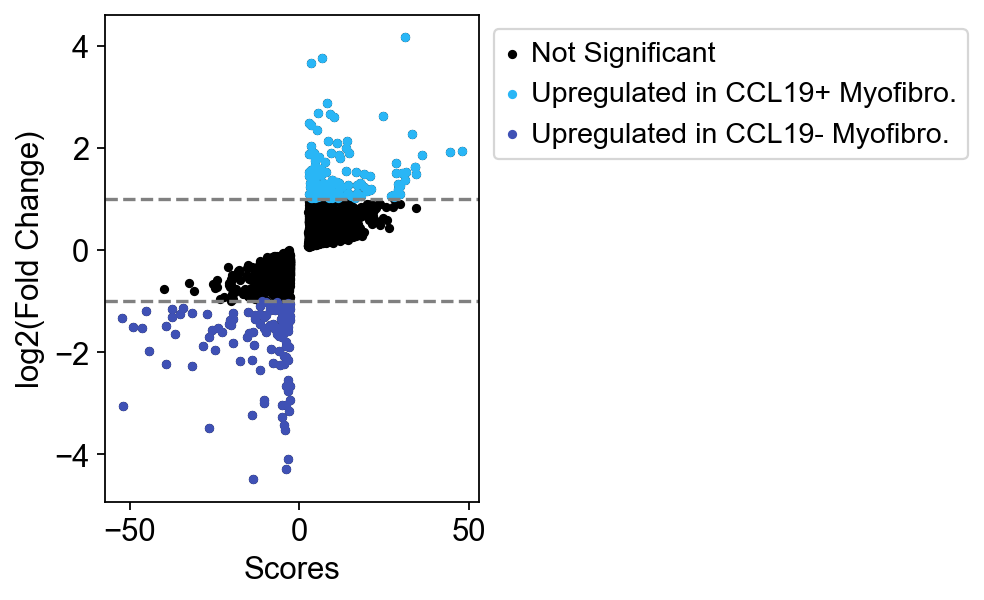

In [18]:
lfc_threshold = 1.0

lfc = marker['logfoldchange']
scores = marker['scores']

plt.figure(figsize = (3,4))
plt.scatter(scores, lfc, c='black', s = 10, label='Not Significant')
plt.scatter(scores[lfc > lfc_threshold], lfc[lfc > lfc_threshold],
            s = 10, c='#29B6F6', label='Upregulated in CCL19+ Myofibro.')
plt.scatter(scores[lfc < -lfc_threshold], lfc[lfc < -lfc_threshold],
            s = 10, c='#3F51B5', label='Upregulated in CCL19- Myofibro.')

plt.axhline(y=lfc_threshold, color='gray', linestyle='--')
plt.axhline(y=-lfc_threshold, color='gray', linestyle='--')

plt.xlabel('Scores')
plt.ylabel('log2(Fold Change)')
plt.legend(bbox_to_anchor=(1, 1))

plt.grid(False)
plt.savefig("Figure/Fig10/10C-myo_volcano.pdf")
plt.show()

### Figure 11 - Stroma Pseudotime

In [3]:
fibro = sc.read_h5ad("3.Stroma/fibro_diff.h5ad")
fibro

AnnData object with n_obs × n_vars = 58590 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R', 'leiden_R2', 'diff_cluster', 'dpt_pseudotime'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dataset_colors', 'diff_cluster_colors', 'diffmap_evals', 'disease_colors', 'hvg', 'iroot', 'leiden', 'leiden_R2_colors', 'minor_cell_type_colors', 'minor_cell_type_sizes', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_diffmap', 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

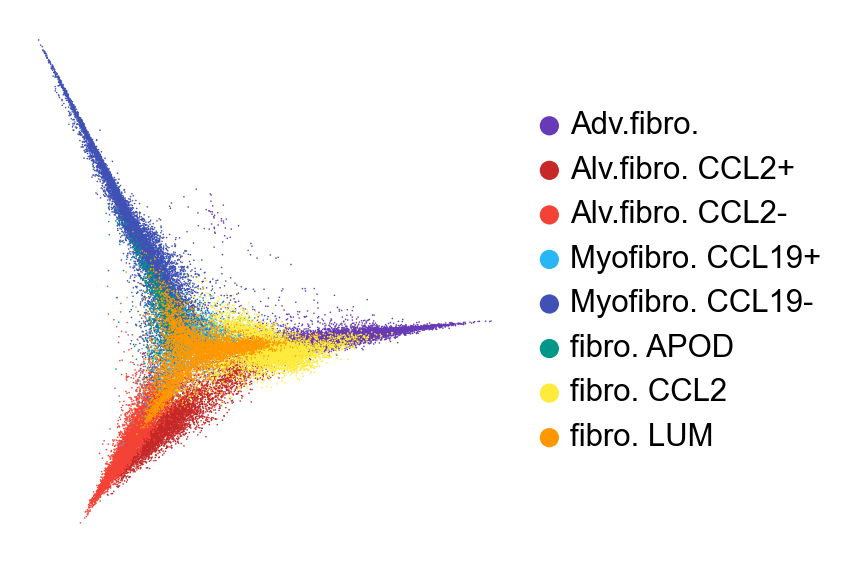

In [4]:
celltype_cols = ["#673AB7", "#C62828", "#F44336", "#29B6F6", "#3F51B5", 
                 "#009688", "#FFEB3B", "#FF9800", "#795548"]

with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.scatter(
        fibro,
        basis="diffmap",
        color=["minor_cell_type"],
        title = "",
        palette = celltype_cols,
        legend_fontsize = 14,
        components=[1, 2],
        frameon = False,
        save = "11A_fibro_minor_cell_type.pdf")

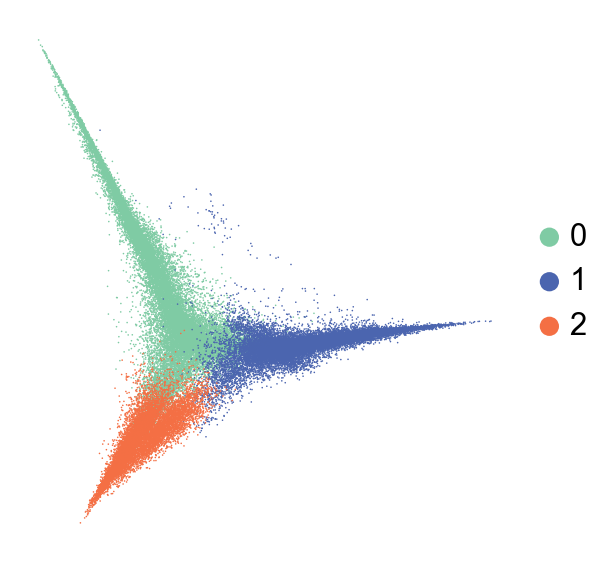

In [5]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.scatter(
        fibro,
        basis = "diffmap",
        color = ["diff_cluster"],
        title = "",
        palette = ["#7fcba4", "#4b65af", "#f46f44"],
        components = [1, 2],
        legend_fontsize = 14,
        frameon = False,
        save = "11B_fibro_diff_cluster.pdf")

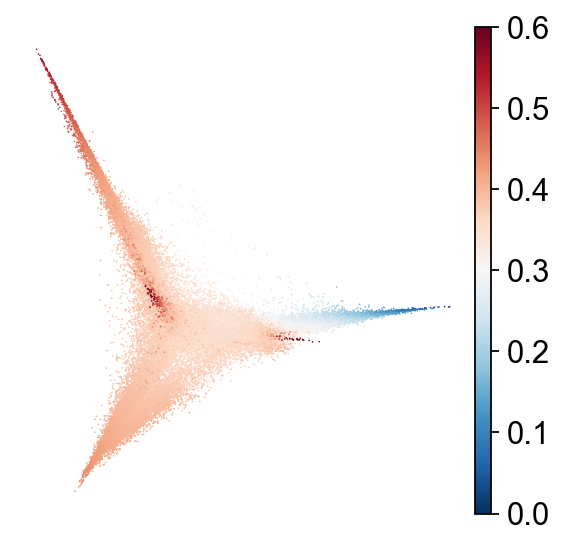

In [6]:
with plt.rc_context({'figure.figsize': (4,4)}):   
    sc.pl.diffmap(
        fibro,
        color = ["dpt_pseudotime"],
        components = ['2, 3'],
        title = "",
        vmax = 0.6,
        color_map = "RdBu_r",
        frameon = False,
        save = "11C_fibro_pseudotime.pdf")

### Figure 13 - Endo clustering

In [40]:
endo = sc.read_h5ad("4.Endo/Endo.h5ad")
endo

AnnData object with n_obs × n_vars = 80050 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R_colors', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


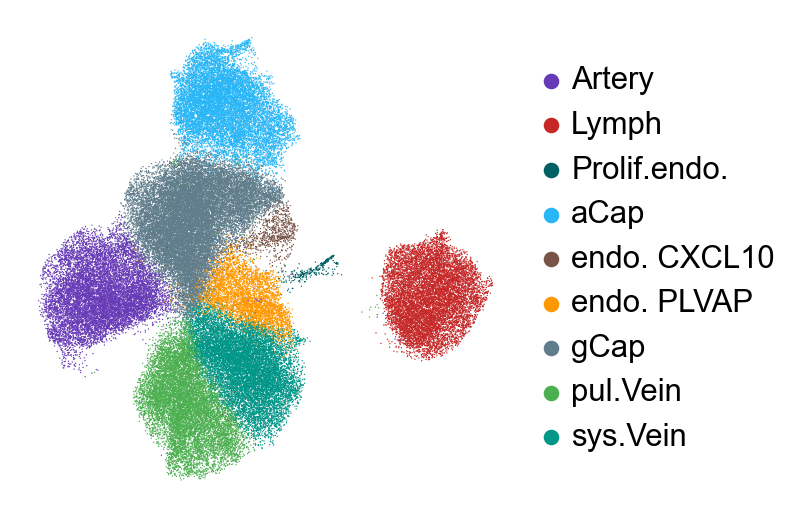

In [41]:
celltype_cols = ["#673AB7", "#C62828", "#006064", 
                 "#29B6F6", "#795548", "#FF9800", 
                 "#607D8B", "#4CAF50", "#009688"]
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(endo, 
               color = "minor_cell_type",
               title = "",
               legend_fontsize = 14,
               palette = celltype_cols,
               frameon = False,
               save = "13A-endo.pdf")

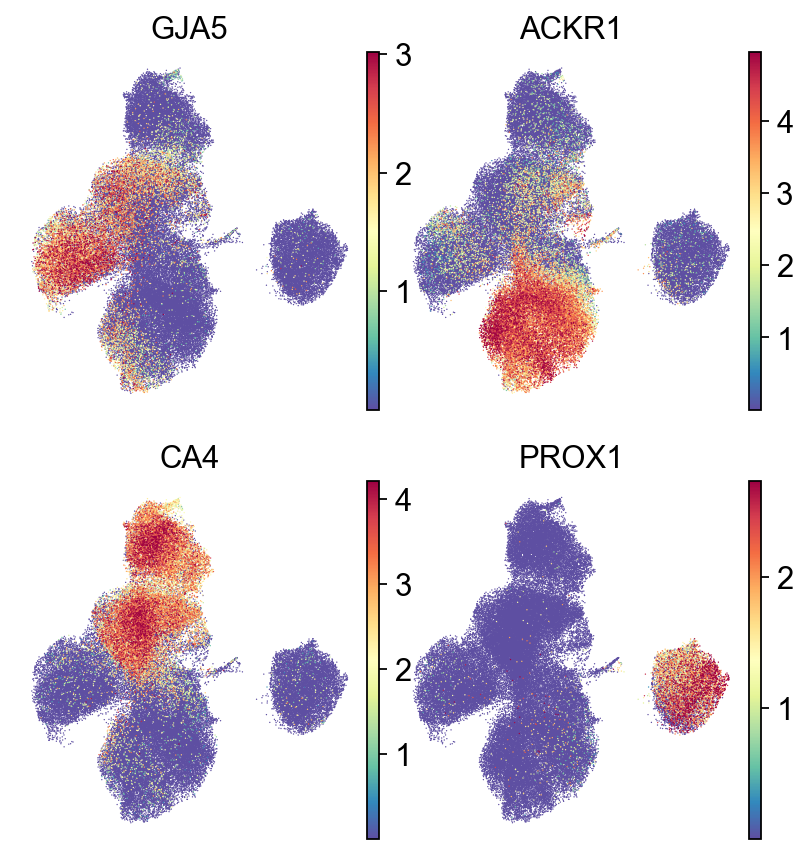

In [21]:
with plt.rc_context({'figure.figsize': (3,3)}):
    sc.pl.umap(endo, 
               color = ["GJA5", "ACKR1", "CA4", "PROX1"],
               ncols = 2, hspace = 0.2, wspace = 0,
               frameon = False,
               vmax = 'p99', vmin = 0.0001,
               color_map = "Spectral_r",
               save = "13B-major_lineage.pdf")

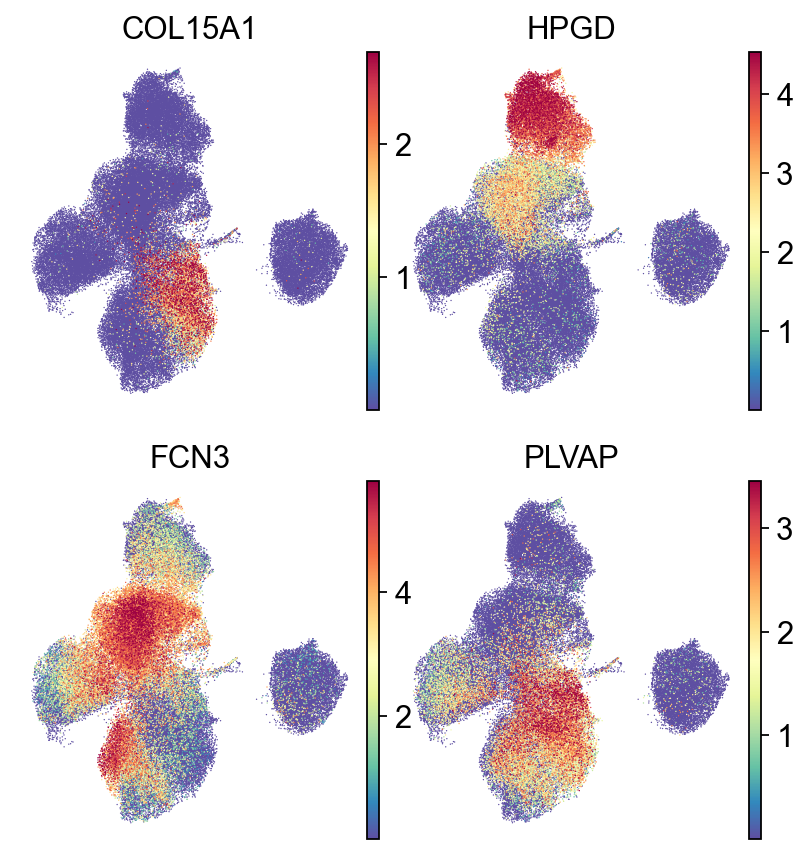

In [30]:
with plt.rc_context({'figure.figsize': (3,3)}):
    sc.pl.umap(endo, 
               color = ["COL15A1", "HPGD", "FCN3", "PLVAP"],
               ncols = 2, hspace = 0.2, wspace = 0,
               frameon = False,
               vmax = 'p99', vmin = 0.0001,
               color_map = "Spectral_r",
               save = "13C-minor_lineage.pdf")

In [45]:
# Marker gene plot
marker_genes_dict = ["DKK2", "IGFBP3",
                     "CPE", "ACKR1",
                     "ZNF385D", "POSTN",
                     "HPGD", "EDNRB",
                     "FCN3", "IL7R",
                     "CCL21", "TFF3",
                     "INSR", "COL15A1",
                     "CXCL10", "CXCL11",
                     "CENPF", "TYMS"]

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


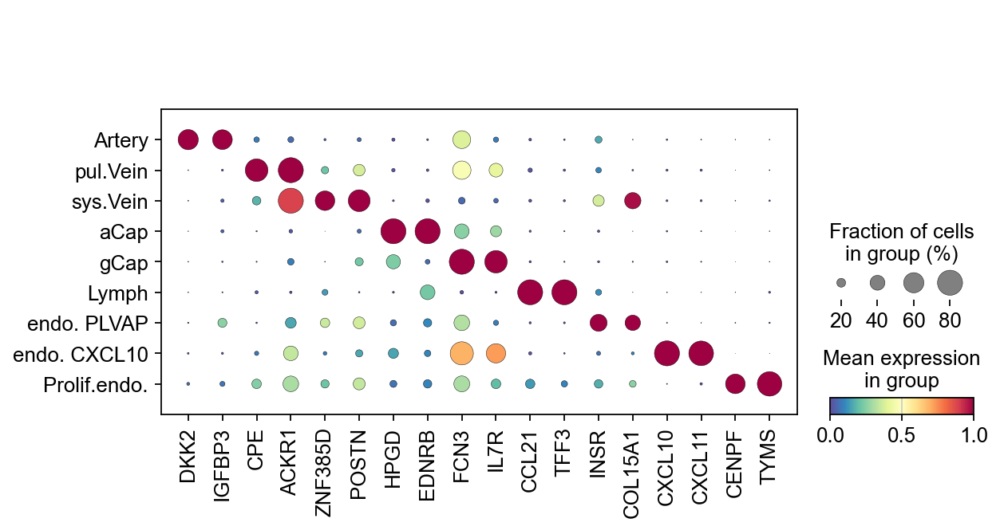

In [46]:
celltype = ["Artery", 
            "pul.Vein",
            "sys.Vein",
            "aCap",
            "gCap",
            "Lymph",
            "endo. PLVAP",
            "endo. CXCL10",
            "Prolif.endo."]

with plt.rc_context({'figure.figsize': (12,8)}):
    sc.pl.dotplot(endo, 
                  marker_genes_dict,
                  groupby = "minor_cell_type",
                  dendrogram = False, 
                  categories_order = celltype,
                  color_map = "Spectral_r",
                  dot_max = 0.8,
                  swap_axes = False,
                  standard_scale = "var",
                  save = "13D_endo_dot.pdf")

### Figure 16 - Stroma label transfer

In [3]:
fibroblast = sc.read_h5ad("5.LabelTransfer/post_fibroblast_tran.h5ad")
fibroblast

AnnData object with n_obs × n_vars = 80203 × 16586
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'major_cell_type', 'Gender', 'Age', 'Histology', 'PD1', 'Chemotherapy', 'Targeted Therapy', 'Cycles', 'Pathological Response', 'Pathological Response Rate', 'Radiological Response', 'Radiological Shrinkage', 'Major Response', 'leiden_0.5', 'dataset', 'conditions_combined', 'minor_cell_type', 'uncertainty'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_0.5_colors', 'leiden_0.6_colors', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


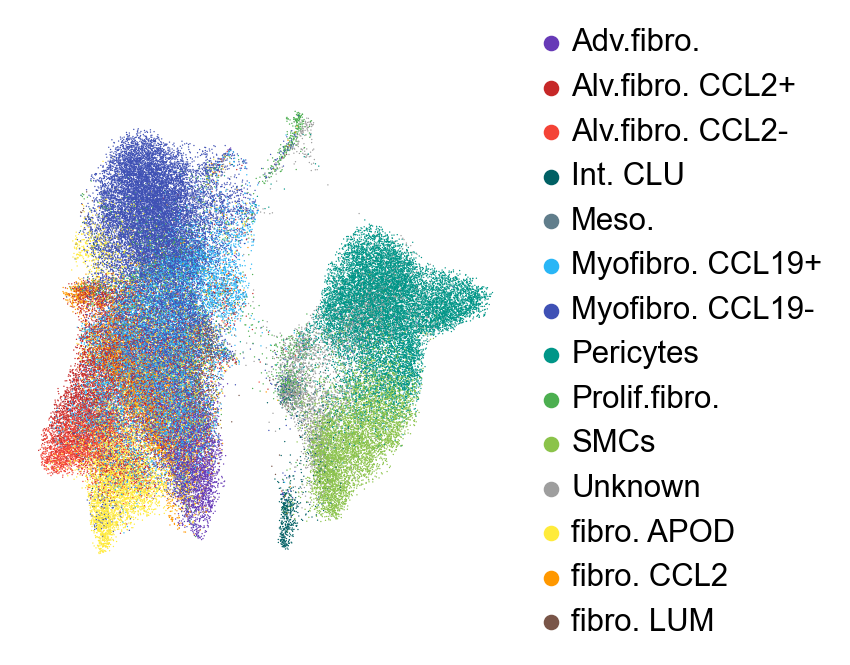

In [8]:
celltype_cols = ["#673AB7", "#C62828", "#F44336", "#006064",
                 "#607D8B", "#29B6F6", "#3F51B5", "#009688", 
                 "#4CAF50", "#8BC34A", "#9E9E9E", "#FFEB3B", 
                 "#FF9800", "#795548"]
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(fibroblast, 
               color = "minor_cell_type",
               title = "",
               legend_fontsize = 14,
               palette = celltype_cols,
               frameon = False,
               save = "16A-celltype.pdf")

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


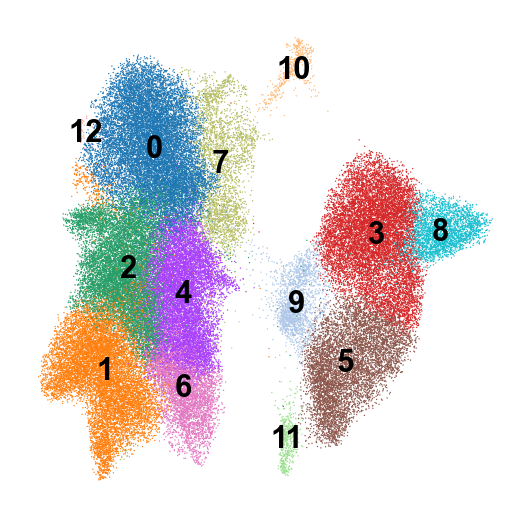

In [5]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(fibroblast, 
               color = "leiden",
               title = "",
               legend_fontsize = 14,
               legend_loc= "on data",
               frameon = False,
               save = "16B-cluster.pdf")

### Figure 17 - Endo label transfer

In [11]:
endo = sc.read_h5ad("5.LabelTransfer/post_endo_tran.h5ad")
endo

AnnData object with n_obs × n_vars = 23347 × 16586
    obs: 'sampleID', 'cellID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'major_cell_type', 'total_counts_rb', 'pct_counts_rb', 'leiden_0.6', 'leiden', 'gender', 'age', 'smoking_history', 'cancer_type', 'pre_treatment_staging', 'anti-PD1_therapy', 'chemotherapy', 'targeted_therapy', 'cycles', 'pathological_response', 'pathological_response_rate', 'radiological_response', 'major_response', 'leiden_0.5', 'leiden_0.3', 'dataset', 'minor_cell_type', 'conditions_combined', 'uncertainty'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_0.3', 'leiden_0.3_colors', 'leiden_0.5', 'leiden_0.6_colors', 'leiden_colors', 'log1p', 'major_cell_type_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
   

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


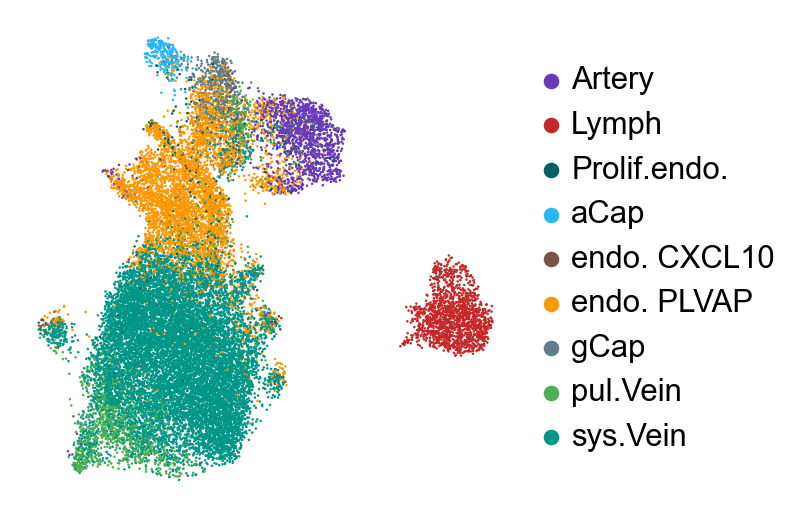

In [12]:
celltype_cols = ["#673AB7", "#C62828", "#006064", 
                 "#29B6F6", "#795548", "#FF9800", 
                 "#607D8B", "#4CAF50", "#009688"]
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(endo, 
               color = "minor_cell_type",
               title = "",
               legend_fontsize = 14,
               palette = celltype_cols,
               frameon = False,
               save = "17A-celltype.pdf")

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


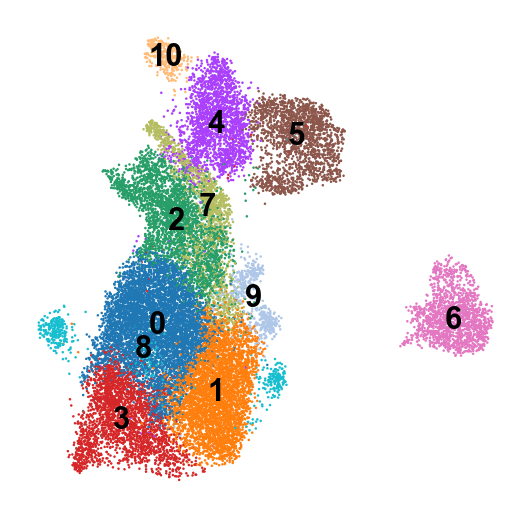

In [13]:
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(endo, 
               color = "leiden",
               title = "",
               legend_fontsize = 14,
               legend_loc= "on data",
               frameon = False,
               save = "17B-cluster.pdf")